In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter

import seaborn as sns
import squarify

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import matplotlib.pyplot as plt
import networkx as nx

#pandas profiling
from pandas_profiling import ProfileReport
#SKlearn preprocessing and model selection tools

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, normalize, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV

#SKlearn clustering tools
from sklearn.impute import KNNImputer
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score, silhouette_samples, classification_report, confusion_matrix, precision_score
from sklearn.cluster import KMeans

#DT 
from sklearn.tree import DecisionTreeClassifier, export_graphviz

#other packages
import statistics
from math import ceil
plt.rcParams['figure.figsize'] = (15, 9)

sns.set()

### Import and merge data

In [2]:
complete_orders = pd.read_csv('./CSV/complete_orders.csv')
del complete_orders['Unnamed: 0']
complete_orders

,department_id,department,product_id,product_name,order_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,k_labels
0,1,frozen,38,frozen meals,11,1,1,143742,4,Monday,19,23.0,1
1,13,pantry,19,oils vinegars,11,5,1,143742,4,Monday,19,23.0,1
2,15,canned goods,59,canned meals beans,11,3,1,143742,4,Monday,19,23.0,1
3,19,snacks,107,chips pretzels,11,4,1,143742,4,Monday,19,23.0,1
4,20,deli,67,fresh dips tapenades,11,2,1,143742,4,Monday,19,23.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928528,21,missing,100,missing,1296769,1,1,50727,10,Friday,12,15.0,0
1928529,21,missing,100,missing,1648925,1,1,9568,8,Thursday,16,6.0,0
1928530,21,missing,100,missing,1955853,1,1,200270,3,Saturday,23,13.0,0
1928531,21,missing,100,missing,2574710,1,0,205651,6,Tuesday,16,30.0,0


### Split by Clusters

Use value on Klabels to split by each cluster of customers

<b>1. Do Exploratory Data Analysis on the Population of each cluster: get a better identifier than cluster_nbr
   
   2. Mine association rules from each cluster: compare size and compare from cluster to cluster.

In [3]:
cluster_0 = complete_orders.loc[complete_orders['k_labels'] == 0]
cluster_1 = complete_orders.loc[complete_orders['k_labels'] == 1]
cluster_2 = complete_orders.loc[complete_orders['k_labels'] == 2]
cluster_3 = complete_orders.loc[complete_orders['k_labels'] == 3]
cluster_4 = complete_orders.loc[complete_orders['k_labels'] == 4]

### Cluster 0

#### Data Exploration

In [4]:
print(f'Number of unique customers in cluster: {len(cluster_0.user_id.unique())}\n'
      f'Number of unique orders made by customers in cluster: {len(cluster_0.order_id.unique())}')

Number of unique customers in cluster: 39044
Number of unique orders made by customers in cluster: 58982


In [5]:
cluster_0.isna().sum()

department_id                 0
department                    0
product_id                    0
product_name                  0
order_id                      0
add_to_cart_order             0
reordered                     0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    10779
k_labels                      0
dtype: int64

In [6]:
cluster_0.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
department_id,423129.0,NaN,NaN,NaN,9.936223,6.253239,1.0,4.0,7.0,16.0,21.0
department,423129,21,produce,119503,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_id,423129.0,NaN,NaN,NaN,70.701734,38.133022,1.0,31.0,81.0,107.0,134.0
product_name,423129,134,fresh fruits,46237,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_id,423129.0,NaN,NaN,NaN,1710633.309508,989273.031519,150.0,847298.0,1704497.0,2570097.0,3421074.0
add_to_cart_order,423129.0,NaN,NaN,NaN,7.072585,6.591121,1.0,2.0,5.0,10.0,83.0
reordered,423129.0,NaN,NaN,NaN,0.563514,0.49595,0.0,0.0,1.0,1.0,1.0
user_id,423129.0,NaN,NaN,NaN,103187.241784,59465.402819,3.0,51561.0,103686.0,154519.0,206201.0
order_number,423129.0,NaN,NaN,NaN,13.312167,13.974574,1.0,4.0,8.0,17.0,100.0
order_dow,423129,7,Tuesday,129764,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Plots - Customer Preferences

1. Department Preferences, 
2. Number of Purchases
3. Number of items in purchase

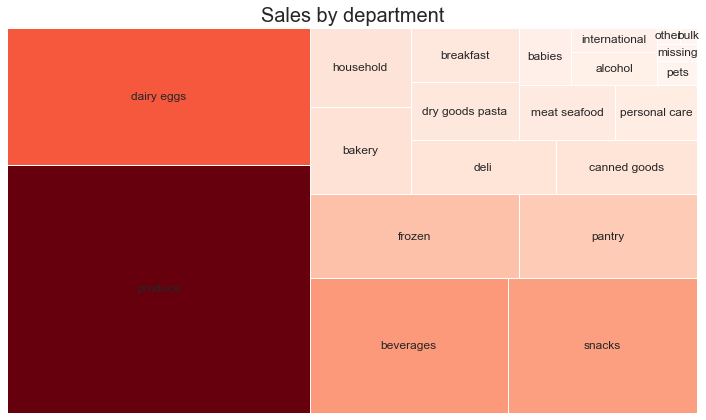

In [7]:
cmap = matplotlib.cm.Reds
mini = min(cluster_0['department'].value_counts())
maxi = max(cluster_0['department'].value_counts())
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(i)) for i in cluster_0['department'].value_counts()]



plt.figure(figsize=(10, 6))
squarify.plot(sizes=cluster_0['department'].value_counts(), label=cluster_0['department'].value_counts().index, color=colors);
plt.title('Sales by department', fontsize=20)
plt.axis('off');
plt.tight_layout()

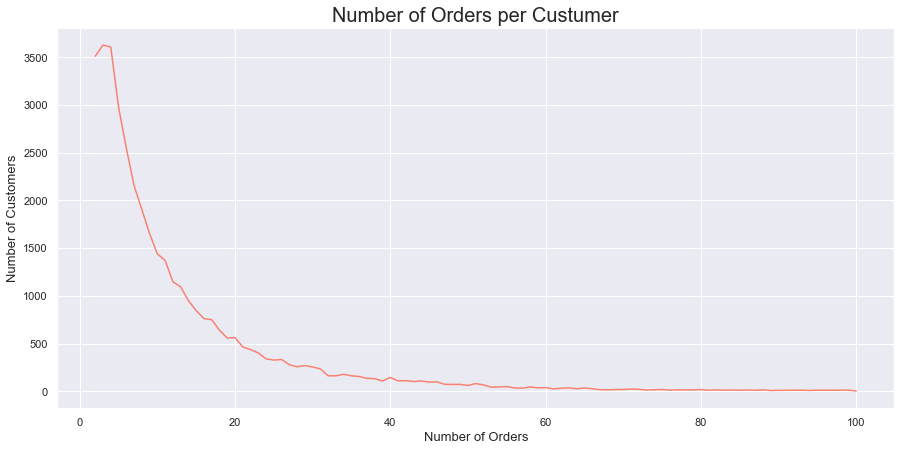

In [8]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_0.groupby("user_id")["order_number"].aggregate(np.max).reset_index()["order_number"].value_counts()

sns.lineplot(x=plot_data.index,
                 y=plot_data.values,
                 color="salmon")

plt.ylabel('Number of Customers', fontsize=13)
plt.xlabel('Number of Orders', fontsize=13)

plt.title("Number of Orders per Custumer", fontsize=20)
plt.show()

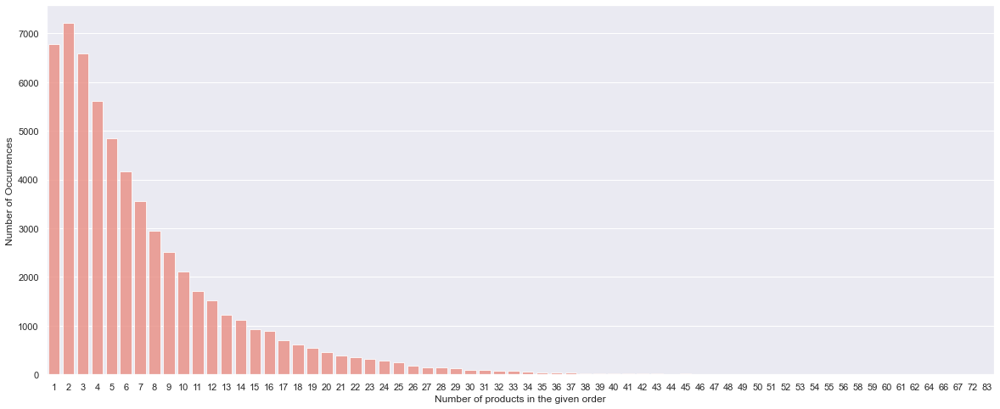

In [9]:
#No. of products per order on an average
grouped_df = cluster_0.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_srs = grouped_df.add_to_cart_order.value_counts()

plt.figure(figsize=(20,8))
sns.barplot(x = cnt_srs.index, y = cnt_srs.values, alpha=0.8, color = 'salmon')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
#plt.xticks(rotation='vertical')
plt.show()

### Customer General Behavior

1. Time of day Preferences
2. Hour Preferences
3. Time between orders by the given customer

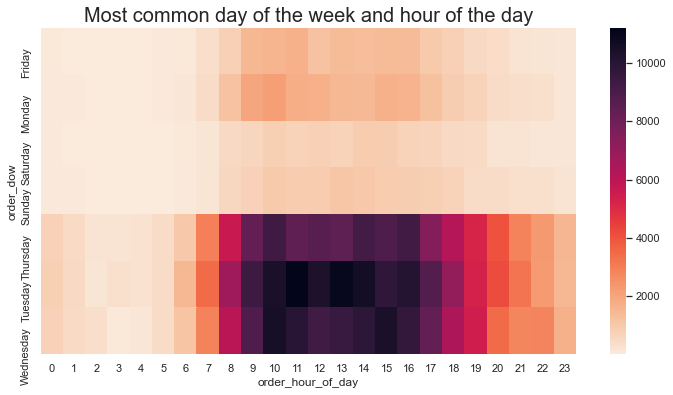

In [10]:
plot_data = cluster_0.groupby(["order_dow", "order_hour_of_day"])["order_number"].agg("count").reset_index()
plot_data = plot_data.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(plot_data,cmap=sns.color_palette("rocket_r", as_cmap=True))
plt.title("Most common day of the week and hour of the day", fontsize=20)
plt.show()

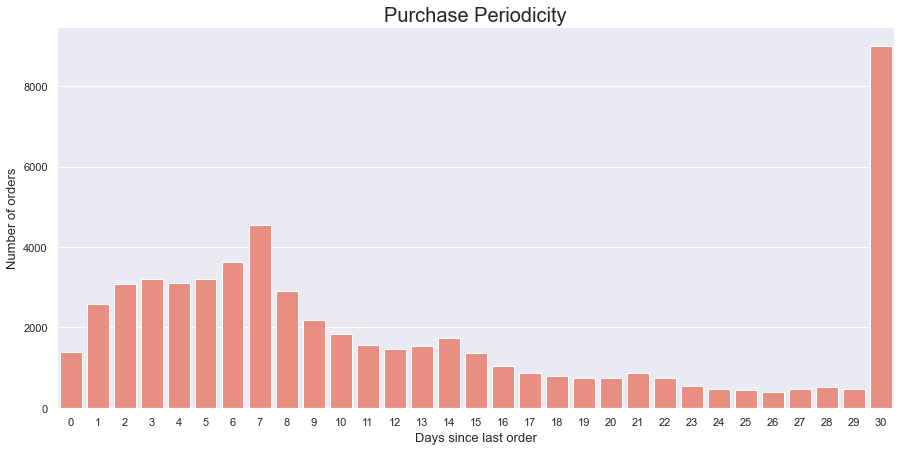

In [11]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_0.groupby('order_id')['days_since_prior_order'].mean().reset_index()['days_since_prior_order'].value_counts()

sns.barplot(x=plot_data.index,
                 y=plot_data.values,
                 color="salmon",
           )
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.ylabel('Number of orders', fontsize=13)
plt.xlabel('Days since last order', fontsize=13)

plt.title("Purchase Periodicity", fontsize=20)
plt.show()

In [12]:
#Finding number of customers
'''## Defining a function to get unique count for user_id from orders.csv'''

def get_unique_count(x):             
    return len(np.unique(x))

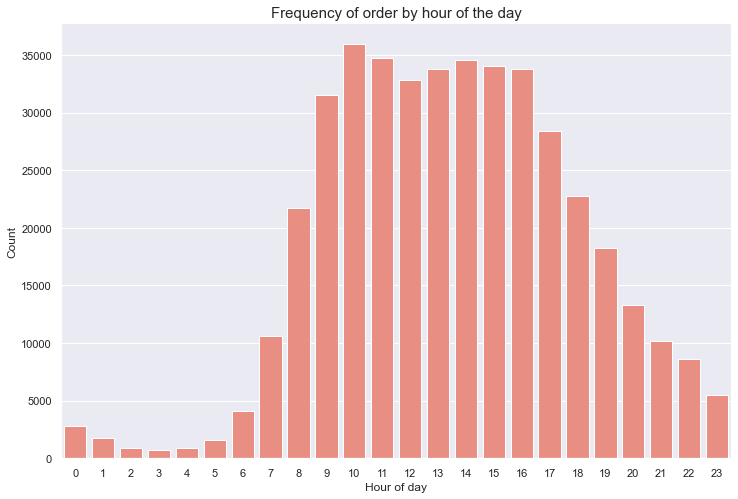

order_hour_of_day
0      374
1      224
2      137
3       91
4      109
5      191
6      559
7     1487
8     3052
9     4613
10    5192
11    4995
12    4632
13    4727
14    4799
15    4753
16    4700
17    3858
18    3147
19    2449
20    1826
21    1282
22    1081
23     704
Name: order_id, dtype: int64

In [13]:
#Figuring out which time of the day is the busiest
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=cluster_0, color='salmon')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.title("Frequency of order by hour of the day", fontsize=15)
plt.show()
cnt_hod = cluster_0.groupby('order_hour_of_day')['order_id'].aggregate(get_unique_count)
cnt_hod

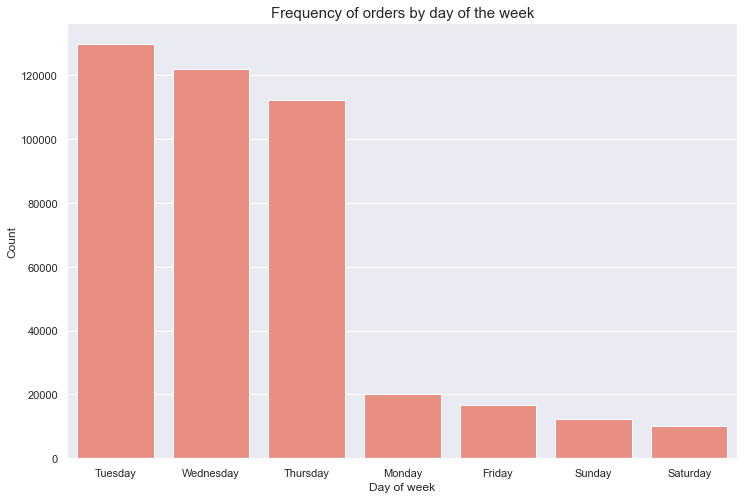

order_dow
Friday        4795
Monday        5745
Saturday      3000
Sunday        3607
Thursday     13072
Tuesday      14605
Wednesday    14158
Name: order_id, dtype: int64

In [14]:
#Finding out the busiest day of the week
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=cluster_0, order=cluster_0['order_dow'].value_counts().index, color='salmon')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Frequency of orders by day of the week", fontsize=15)
plt.show()
cnt_dow = cluster_0.groupby('order_dow')['order_id'].aggregate(get_unique_count)
cnt_dow

<b>39044 customers with 58982 orders.<b>
 

Overall observations: 
    
Low frequency buyers
Low lenght of purchase: 1 to 4 items at a time
    
Proneness to make purchases on Tuesdays, Wednesdays and Thursdays between 9 and 17.

Top 6 departments: Produce, Dairy Eggs, Beverages, Snacks, Frozen and Pantry

### Cluster 1

#### Data Exploration

In [15]:
print(f'Number of unique customers in cluster: {len(cluster_1.user_id.unique())}\n'
      f'Number of unique orders made by customers in cluster: {len(cluster_1.order_id.unique())}')

Number of unique customers in cluster: 15632
Number of unique orders made by customers in cluster: 37041


In [16]:
cluster_1.isna().sum()

department_id                 0
department                    0
product_id                    0
product_name                  0
order_id                      0
add_to_cart_order             0
reordered                     0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    12953
k_labels                      0
dtype: int64

In [17]:
cluster_1.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
department_id,416044.0,NaN,NaN,NaN,10.104994,6.317445,1.0,4.0,9.0,16.0,21.0
department,416044,21,produce,120060,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_id,416044.0,NaN,NaN,NaN,71.287335,38.409745,1.0,31.0,83.0,107.0,134.0
product_name,416044,134,fresh fruits,48212,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_id,416044.0,NaN,NaN,NaN,1710059.433875,987709.942554,11.0,854502.0,1702497.0,2567620.0,3421080.0
add_to_cart_order,416044.0,NaN,NaN,NaN,8.603878,7.228071,1.0,3.0,7.0,12.0,109.0
reordered,416044.0,NaN,NaN,NaN,0.635241,0.481363,0.0,0.0,1.0,1.0,1.0
user_id,416044.0,NaN,NaN,NaN,103490.126979,59963.393587,21.0,51680.0,102573.0,155827.0,206208.0
order_number,416044.0,NaN,NaN,NaN,19.851146,19.013511,1.0,6.0,13.0,28.0,100.0
order_dow,416044,7,Monday,249614,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Plots - Customer Preferences

1. Department Preferences, 
2. Number of Purchases
3. Number of items in purchase

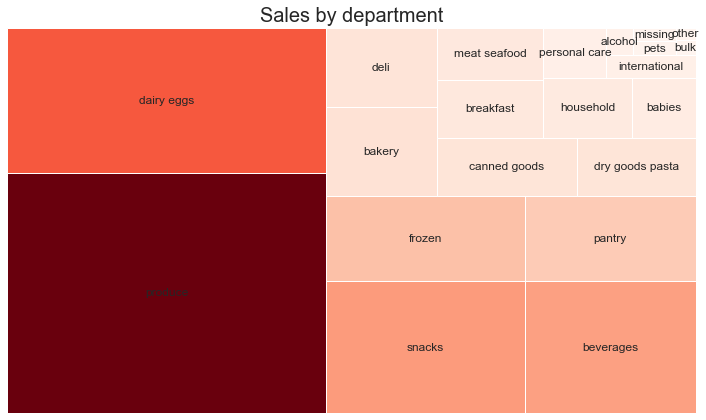

In [18]:
cmap = matplotlib.cm.Reds
mini = min(cluster_1['department'].value_counts())
maxi = max(cluster_1['department'].value_counts())
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(i)) for i in cluster_0['department'].value_counts()]



plt.figure(figsize=(10, 6))
squarify.plot(sizes=cluster_1['department'].value_counts(), label=cluster_1['department'].value_counts().index, color=colors);
plt.title('Sales by department', fontsize=20)
plt.axis('off');
plt.tight_layout()

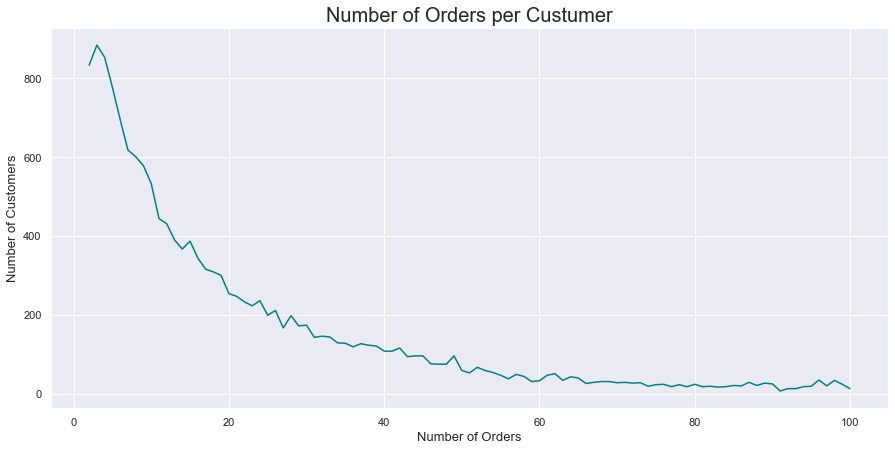

In [19]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_1.groupby("user_id")["order_number"].aggregate(np.max).reset_index()["order_number"].value_counts()

sns.lineplot(x=plot_data.index,
                 y=plot_data.values,
                 color="teal")

plt.ylabel('Number of Customers', fontsize=13)
plt.xlabel('Number of Orders', fontsize=13)

plt.title("Number of Orders per Custumer", fontsize=20)
plt.show()

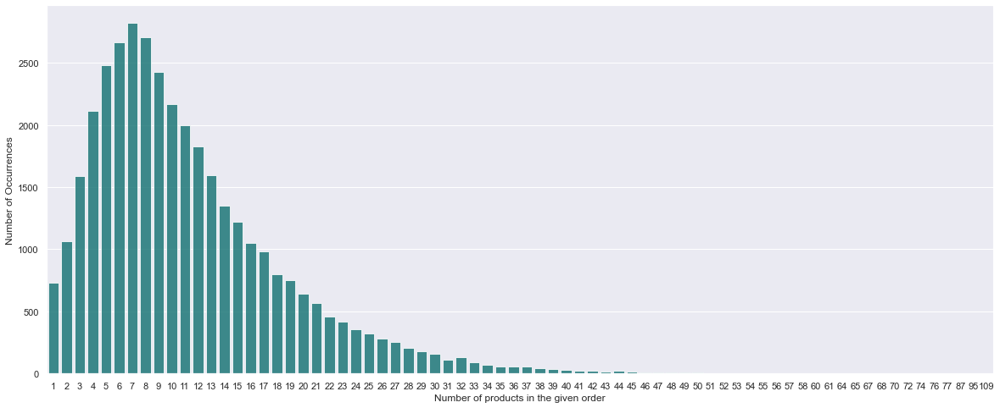

In [20]:
#No. of products per order on an average
grouped_df = cluster_1.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_srs = grouped_df.add_to_cart_order.value_counts()

plt.figure(figsize=(20,8))
sns.barplot(x = cnt_srs.index, y = cnt_srs.values, alpha=0.8, color = 'teal')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
#plt.xticks(rotation='vertical')
plt.show()

### Customer General Behavior

1. Time of day Preferences
2. Hour Preferences
3. Time between orders by the given customer

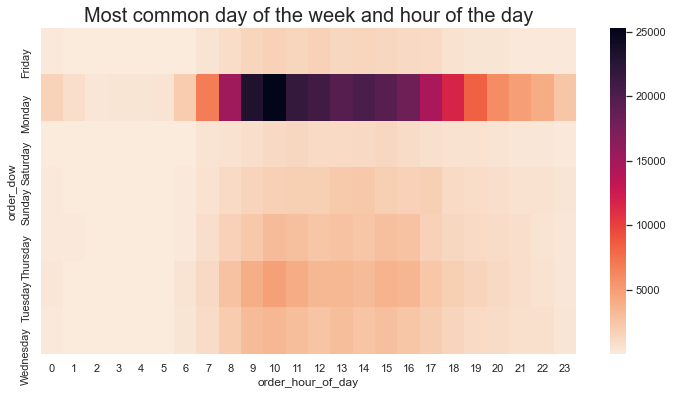

In [21]:
plot_data = cluster_1.groupby(["order_dow", "order_hour_of_day"])["order_number"].agg("count").reset_index()
plot_data = plot_data.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(plot_data,cmap=sns.color_palette("rocket_r", as_cmap=True))
plt.title("Most common day of the week and hour of the day", fontsize=20)
plt.show()

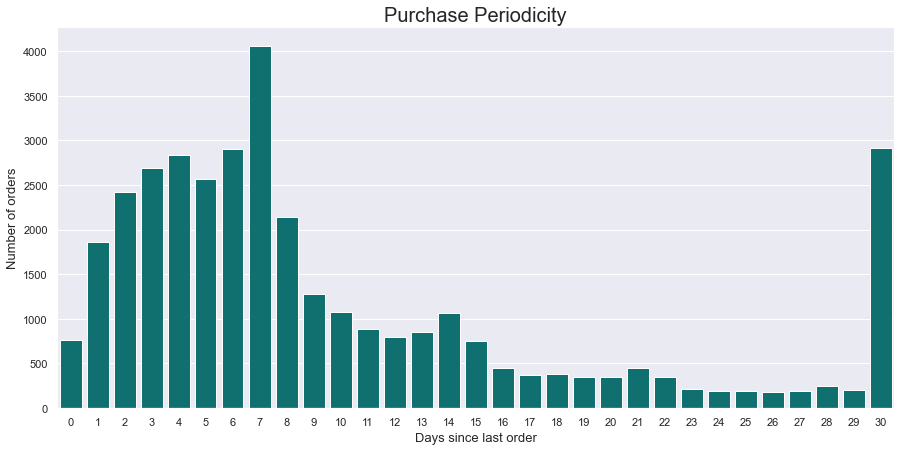

In [22]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_1.groupby('order_id')['days_since_prior_order'].mean().reset_index()['days_since_prior_order'].value_counts()

sns.barplot(x=plot_data.index,
                 y=plot_data.values,
                 color="teal",
           )
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.ylabel('Number of orders', fontsize=13)
plt.xlabel('Days since last order', fontsize=13)

plt.title("Purchase Periodicity", fontsize=20)
plt.show()

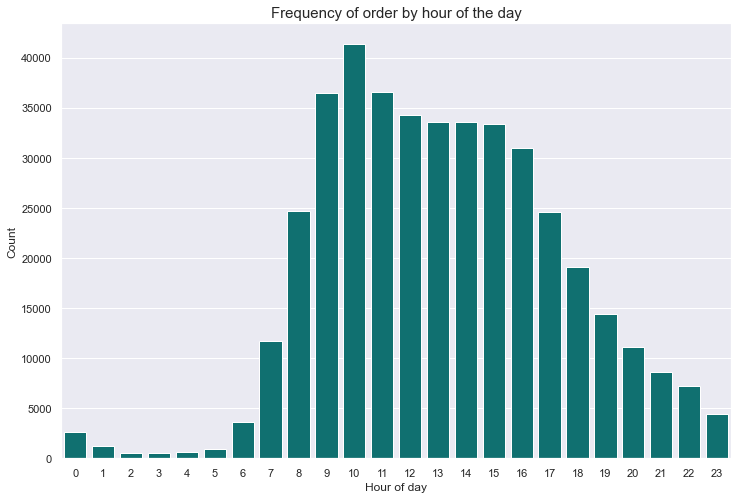

order_hour_of_day
0      221
1      104
2       50
3       41
4       61
5       87
6      318
7     1034
8     2151
9     3231
10    3633
11    3274
12    2982
13    2952
14    3021
15    3019
16    2805
17    2240
18    1815
19    1345
20     988
21     715
22     587
23     367
Name: order_id, dtype: int64

In [23]:
#Figuring out which time of the day is the busiest
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=cluster_1, color='teal')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.title("Frequency of order by hour of the day", fontsize=15)
plt.show()
cnt_hod = cluster_1.groupby('order_hour_of_day')['order_id'].aggregate(get_unique_count)
cnt_hod

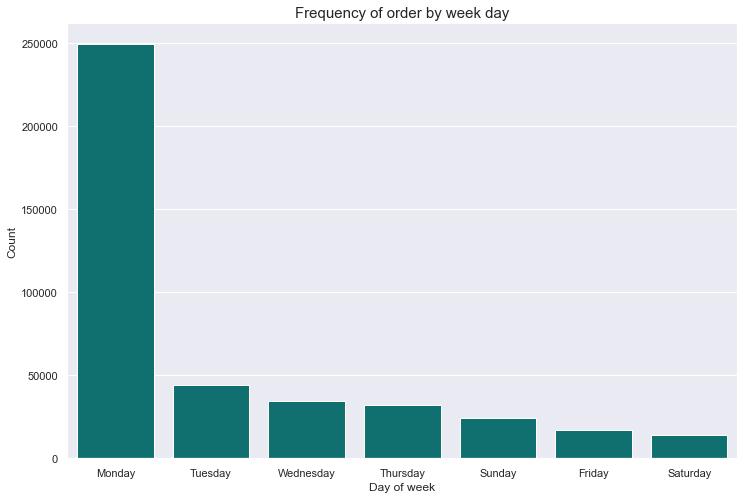

order_dow
Friday        2052
Monday       20235
Saturday      1612
Sunday        2434
Thursday      3178
Tuesday       4120
Wednesday     3410
Name: order_id, dtype: int64

In [24]:
#Finding out the busiest day of the week
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=cluster_1, order=cluster_1['order_dow'].value_counts().index, color='teal')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Frequency of order by week day", fontsize=15)
plt.show()
cnt_dow = cluster_1.groupby('order_dow')['order_id'].aggregate(get_unique_count)
cnt_dow

<b>15632 customers with 37041 orders.<b>
 

Overall observations: 
    
Weekly buyers
Reasonable lenght of purchase: 6 to 14 items at a time
    
Proneness to make purchases on Monday 9 and 17.

Top 6 departments: Produce, Dairy Eggs, Snacks, Beverages, Frozen, Pantry

### Cluster 2

#### Data Exploration

In [25]:
print(f'Number of unique customers in cluster: {len(cluster_2.user_id.unique())}\n'
      f'Number of unique orders made by customers in cluster: {len(cluster_2.order_id.unique())}')

Number of unique customers in cluster: 17900
Number of unique orders made by customers in cluster: 37000


In [26]:
cluster_2.isna().sum()

department_id                 0
department                    0
product_id                    0
product_name                  0
order_id                      0
add_to_cart_order             0
reordered                     0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    14299
k_labels                      0
dtype: int64

In [27]:
cluster_2.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
department_id,432847.0,NaN,NaN,NaN,9.786899,6.278105,1.0,4.0,8.0,16.0,21.0
department,432847,21,produce,132980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_id,432847.0,NaN,NaN,NaN,71.425478,38.222933,1.0,31.0,83.0,107.0,134.0
product_name,432847,134,fresh vegetables,50543,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_id,432847.0,NaN,NaN,NaN,1710734.495143,981596.579888,56.0,863546.0,1709098.0,2557560.0,3421027.0
add_to_cart_order,432847.0,NaN,NaN,NaN,8.844183,7.183001,1.0,3.0,7.0,12.0,93.0
reordered,432847.0,NaN,NaN,NaN,0.610888,0.487549,0.0,0.0,1.0,1.0,1.0
user_id,432847.0,NaN,NaN,NaN,103198.443794,59091.538541,7.0,52167.0,102776.0,153953.5,206206.0
order_number,432847.0,NaN,NaN,NaN,17.246286,16.722911,1.0,5.0,12.0,24.0,100.0
order_dow,432847,7,Sunday,293608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Plots - Customer Preferences

1. Department Preferences, 
2. Number of Purchases
3. Number of items in purchase

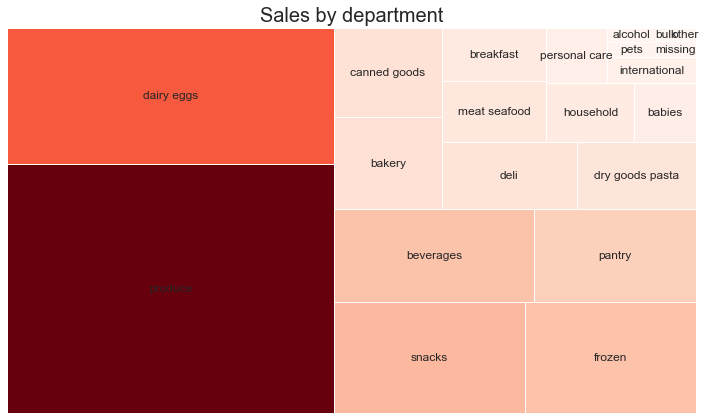

In [28]:
cmap = matplotlib.cm.Reds
mini = min(cluster_2['department'].value_counts())
maxi = max(cluster_2['department'].value_counts())
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(i)) for i in cluster_2['department'].value_counts()]



plt.figure(figsize=(10, 6))
squarify.plot(sizes=cluster_2['department'].value_counts(), label=cluster_2['department'].value_counts().index, color=colors);
plt.title('Sales by department', fontsize=20)
plt.axis('off');
plt.tight_layout()

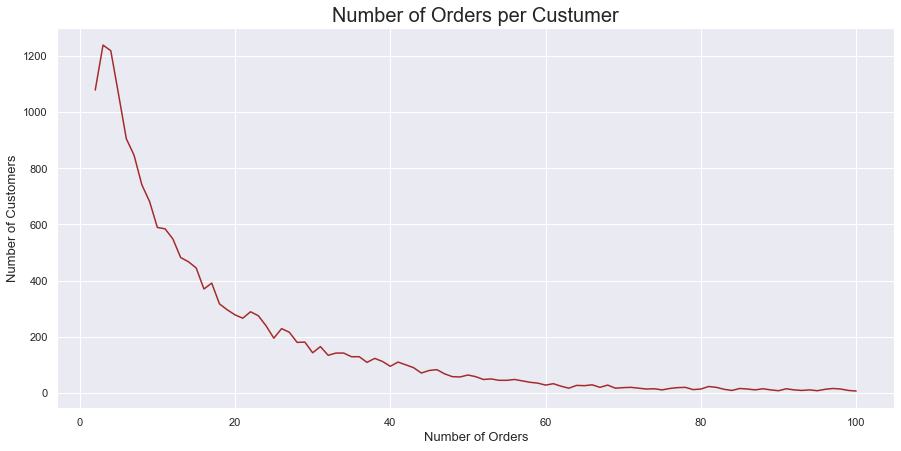

In [29]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_2.groupby("user_id")["order_number"].aggregate(np.max).reset_index()["order_number"].value_counts()

sns.lineplot(x=plot_data.index,
                 y=plot_data.values,
                 color="brown")

plt.ylabel('Number of Customers', fontsize=13)
plt.xlabel('Number of Orders', fontsize=13)

plt.title("Number of Orders per Custumer", fontsize=20)
plt.show()

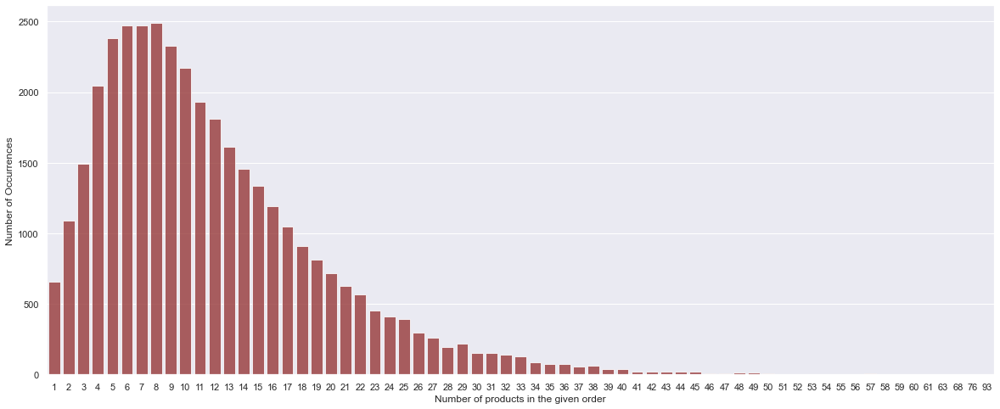

In [30]:
#No. of products per order on an average
grouped_df = cluster_2.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_srs = grouped_df.add_to_cart_order.value_counts()

plt.figure(figsize=(20,8))
sns.barplot(x = cnt_srs.index, y = cnt_srs.values, alpha=0.8, color = 'brown')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
#plt.xticks(rotation='vertical')
plt.show()

### Customer General Behavior

1. Time of day Preferences
2. Hour Preferences
3. Time between orders by the given customer

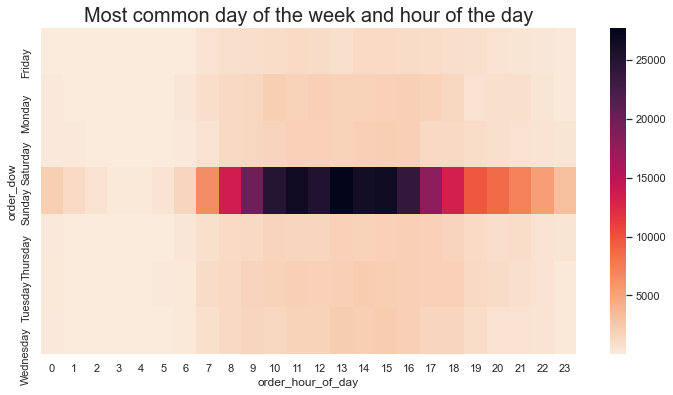

In [31]:
plot_data = cluster_2.groupby(["order_dow", "order_hour_of_day"])["order_number"].agg("count").reset_index()
plot_data = plot_data.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(plot_data,cmap=sns.color_palette("rocket_r", as_cmap=True))
plt.title("Most common day of the week and hour of the day", fontsize=20)
plt.show()

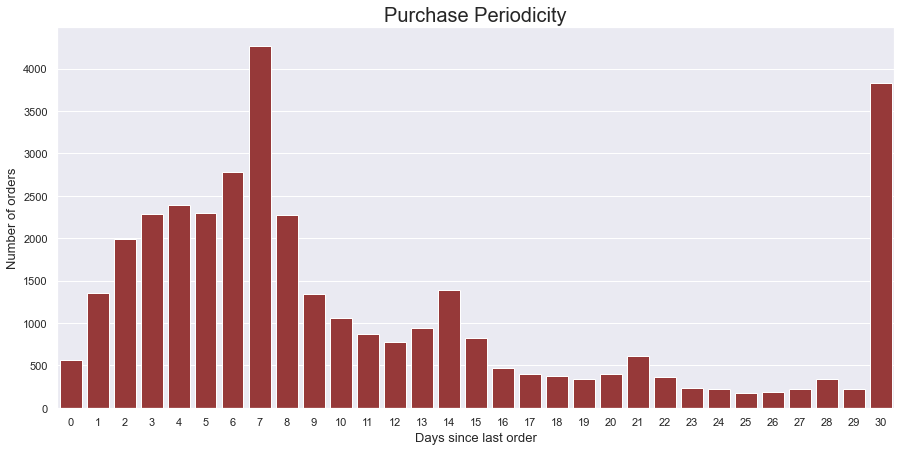

In [32]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_2.groupby('order_id')['days_since_prior_order'].mean().reset_index()['days_since_prior_order'].value_counts()

sns.barplot(x=plot_data.index,
                 y=plot_data.values,
                 color="brown",
           )
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.ylabel('Number of orders', fontsize=13)
plt.xlabel('Days since last order', fontsize=13)

plt.title("Purchase Periodicity", fontsize=20)
plt.show()

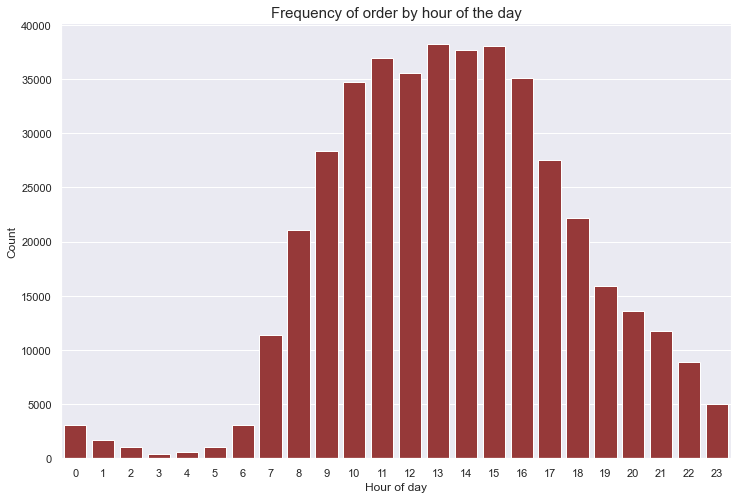

order_hour_of_day
0      260
1      150
2       91
3       41
4       64
5       94
6      272
7      984
8     1720
9     2373
10    2858
11    3051
12    2995
13    3131
14    3224
15    3259
16    3055
17    2533
18    2053
19    1496
20    1212
21     934
22     744
23     406
Name: order_id, dtype: int64

In [33]:
#Figuring out which time of the day is the busiest
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=cluster_2, color='brown')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.title("Frequency of order by hour of the day", fontsize=15)
plt.show()
cnt_hod = cluster_2.groupby('order_hour_of_day')['order_id'].aggregate(get_unique_count)
cnt_hod

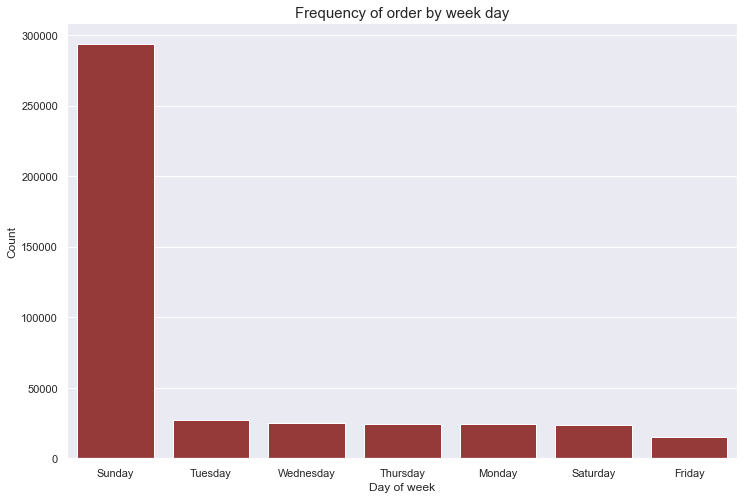

order_dow
Friday        1764
Monday        2578
Saturday      2460
Sunday       22854
Thursday      2372
Tuesday       2565
Wednesday     2407
Name: order_id, dtype: int64

In [34]:
#Finding out the busiest day of the week
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=cluster_2, order=cluster_2['order_dow'].value_counts().index, color='brown')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Frequency of order by week day", fontsize=15)
plt.show()
cnt_dow = cluster_2.groupby('order_dow')['order_id'].aggregate(get_unique_count)
cnt_dow

<b>17900 customers with 37000 orders.<b>
 

Overall observations: 
    
Weekly buyers
Reasonable lenght of purchase: 5 to 15 items at a time
    
Proneness to make purchases on Sunday 9 and 17.

Top 6 departments: Produce, Dairy Eggs, Snacks, Frozen, Beverages, Pantry

### Cluster 3

#### Data Exploration

In [35]:
print(f'Number of unique customers in cluster: {len(cluster_3.user_id.unique())}\n'
      f'Number of unique orders made by customers in cluster: {len(cluster_3.order_id.unique())}')

Number of unique customers in cluster: 12936
Number of unique orders made by customers in cluster: 27569


In [36]:
cluster_3.isna().sum()

department_id                 0
department                    0
product_id                    0
product_name                  0
order_id                      0
add_to_cart_order             0
reordered                     0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    10657
k_labels                      0
dtype: int64

In [37]:
cluster_3.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
department_id,316478.0,NaN,NaN,NaN,9.789211,6.265077,1.0,4.0,9.0,16.0,21.0
department,316478,21,produce,94074,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_id,316478.0,NaN,NaN,NaN,71.194279,38.028093,1.0,31.0,83.0,106.0,134.0
product_name,316478,134,fresh vegetables,36252,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_id,316478.0,NaN,NaN,NaN,1705356.718296,982616.596413,10.0,860354.0,1699970.5,2546933.0,3420899.0
add_to_cart_order,316478.0,NaN,NaN,NaN,8.777915,7.215667,1.0,3.0,7.0,12.0,92.0
reordered,316478.0,NaN,NaN,NaN,0.601859,0.489516,0.0,0.0,1.0,1.0,1.0
user_id,316478.0,NaN,NaN,NaN,103266.745022,59472.338552,50.0,51748.0,102993.0,154645.0,206197.0
order_number,316478.0,NaN,NaN,NaN,17.777741,17.368283,1.0,5.0,12.0,24.0,100.0
order_dow,316478,7,Saturday,202109,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Plots - Customer Preferences

1. Department Preferences, 
2. Number of Purchases
3. Number of items in purchase

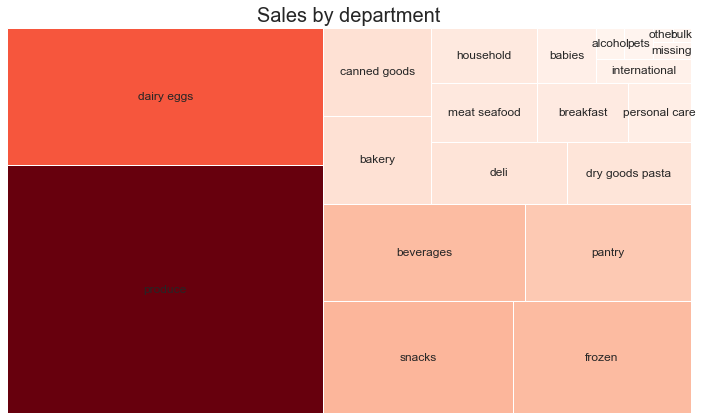

In [38]:
cmap = matplotlib.cm.Reds
mini = min(cluster_3['department'].value_counts())
maxi = max(cluster_3['department'].value_counts())
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(i)) for i in cluster_3['department'].value_counts()]



plt.figure(figsize=(10, 6))
squarify.plot(sizes=cluster_3['department'].value_counts(), label=cluster_3['department'].value_counts().index, color=colors);
plt.title('Sales by department', fontsize=20)
plt.axis('off');
plt.tight_layout()

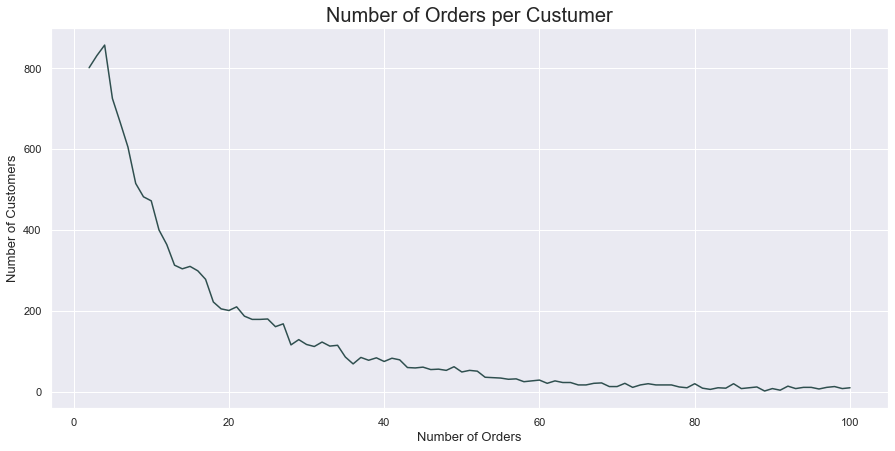

In [39]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_3.groupby("user_id")["order_number"].aggregate(np.max).reset_index()["order_number"].value_counts()

sns.lineplot(x=plot_data.index,
                 y=plot_data.values,
                 color="darkslategray")

plt.ylabel('Number of Customers', fontsize=13)
plt.xlabel('Number of Orders', fontsize=13)

plt.title("Number of Orders per Custumer", fontsize=20)
plt.show()

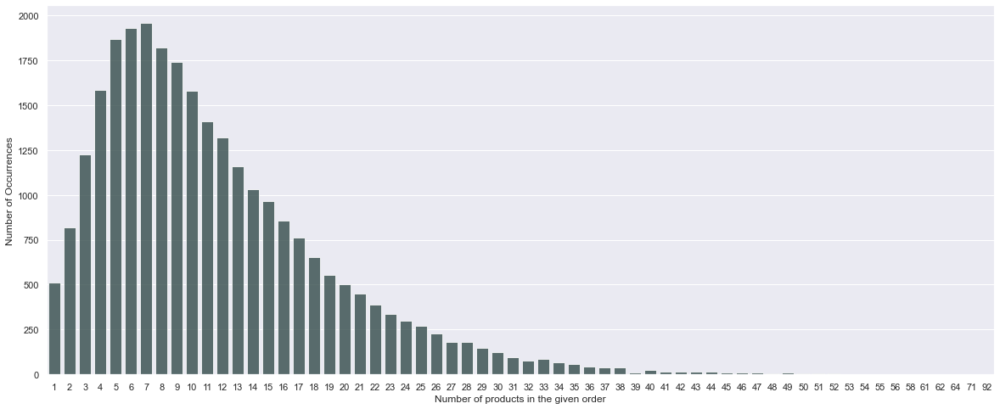

In [40]:
#No. of products per order on an average
grouped_df = cluster_3.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_srs = grouped_df.add_to_cart_order.value_counts()

plt.figure(figsize=(20,8))
sns.barplot(x = cnt_srs.index, y = cnt_srs.values, alpha=0.8, color = 'darkslategray')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
#plt.xticks(rotation='vertical')
plt.show()

### Customer General Behavior

1. Time of day Preferences
2. Hour Preferences
3. Time between orders by the given customer

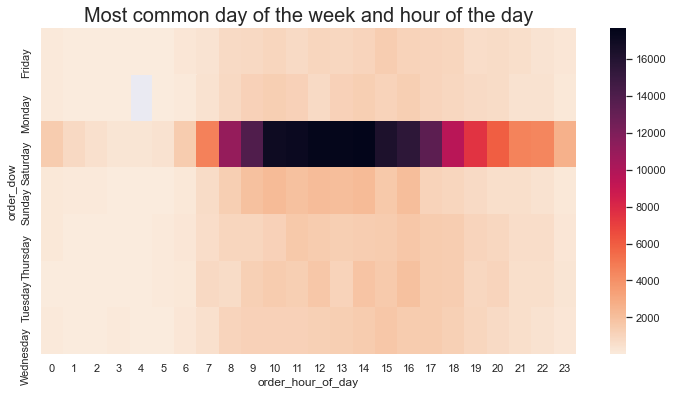

In [41]:
plot_data = cluster_3.groupby(["order_dow", "order_hour_of_day"])["order_number"].agg("count").reset_index()
plot_data = plot_data.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(plot_data,cmap=sns.color_palette("rocket_r", as_cmap=True))
plt.title("Most common day of the week and hour of the day", fontsize=20)
plt.show()

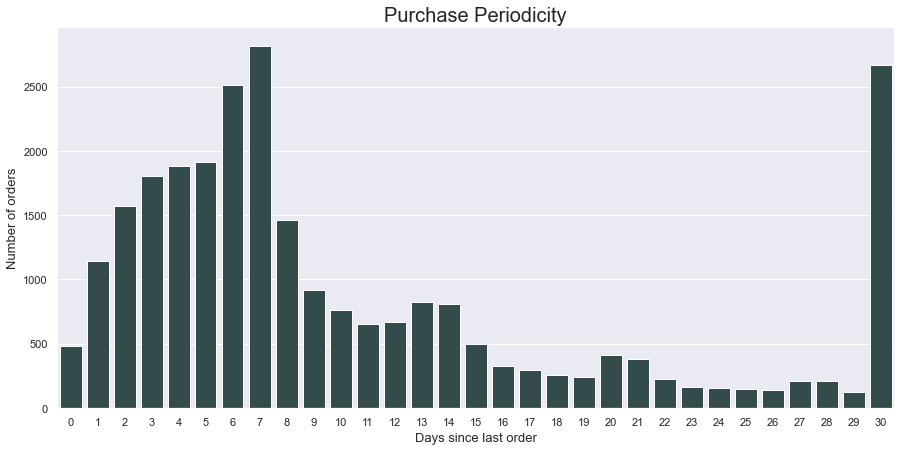

In [42]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_3.groupby('order_id')['days_since_prior_order'].mean().reset_index()['days_since_prior_order'].value_counts()

sns.barplot(x=plot_data.index,
                 y=plot_data.values,
                 color="darkslategray",
           )
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.ylabel('Number of orders', fontsize=13)
plt.xlabel('Days since last order', fontsize=13)

plt.title("Purchase Periodicity", fontsize=20)
plt.show()

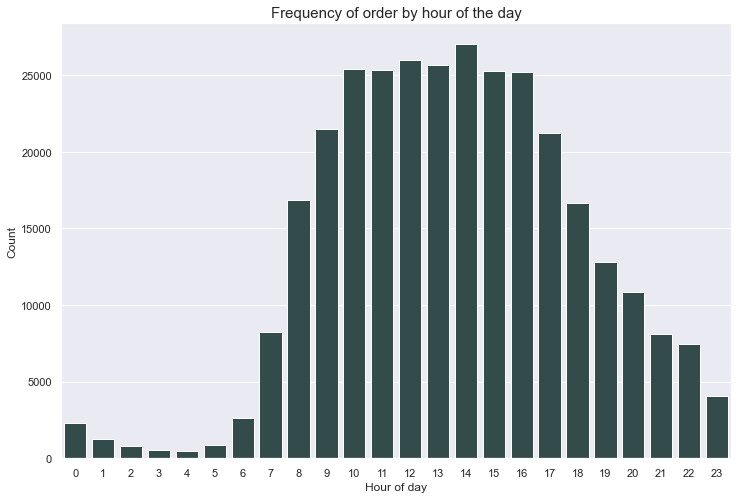

order_hour_of_day
0      207
1      116
2       67
3       46
4       37
5       72
6      242
7      713
8     1361
9     1824
10    2126
11    2161
12    2202
13    2201
14    2316
15    2251
16    2234
17    1955
18    1590
19    1230
20     974
21     701
22     590
23     353
Name: order_id, dtype: int64

In [43]:
#Figuring out which time of the day is the busiest
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=cluster_3, color='darkslategray')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.title("Frequency of order by hour of the day", fontsize=15)
plt.show()
cnt_hod = cluster_3.groupby('order_hour_of_day')['order_id'].aggregate(get_unique_count)
cnt_hod

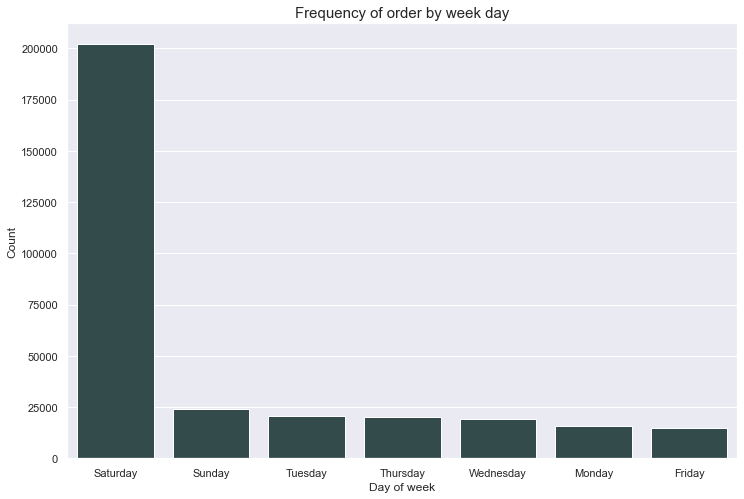

order_dow
Friday        1590
Monday        1755
Saturday     15936
Sunday        2488
Thursday      1952
Tuesday       1985
Wednesday     1863
Name: order_id, dtype: int64

In [44]:
#Finding out the busiest day of the week
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=cluster_3, order=cluster_3['order_dow'].value_counts().index, color='darkslategray')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Frequency of order by week day", fontsize=15)
plt.show()
cnt_dow = cluster_3.groupby('order_dow')['order_id'].aggregate(get_unique_count)
cnt_dow

<b>12936 customers with 27569 orders.

Overall observations:

Weekly buyers Reasonable lenght of purchase: 5 to 15 items at a time

Proneness to make purchases on Saturday 9 and 17.

Top 6 departments: Produce, Dairy Eggs, Snacks, Frozen, Beverages, Pantry

### Cluster 4

#### Data Exploration

In [45]:
print(f'Number of unique customers in cluster: {len(cluster_4.user_id.unique())}\n'
      f'Number of unique orders made by customers in cluster: {len(cluster_4.order_id.unique())}')

Number of unique customers in cluster: 12183
Number of unique orders made by customers in cluster: 30422


In [46]:
cluster_4.isna().sum()

department_id                 0
department                    0
product_id                    0
product_name                  0
order_id                      0
add_to_cart_order             0
reordered                     0
user_id                       0
order_number                  0
order_dow                     0
order_hour_of_day             0
days_since_prior_order    10535
k_labels                      0
dtype: int64

In [47]:
cluster_4.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
department_id,340035.0,NaN,NaN,NaN,10.025839,6.294966,1.0,4.0,9.0,16.0,21.0
department,340035,21,produce,96595,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_id,340035.0,NaN,NaN,NaN,71.465552,38.230885,1.0,31.0,83.0,107.0,134.0
product_name,340035,134,fresh fruits,38582,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_id,340035.0,NaN,NaN,NaN,1700284.573594,989478.117537,122.0,838354.0,1709224.0,2554595.0,3420964.0
add_to_cart_order,340035.0,NaN,NaN,NaN,8.684674,7.48639,1.0,3.0,7.0,12.0,137.0
reordered,340035.0,NaN,NaN,NaN,0.638578,0.480413,0.0,0.0,1.0,1.0,1.0
user_id,340035.0,NaN,NaN,NaN,101962.019721,59431.651651,2.0,50470.0,100982.0,153740.0,206209.0
order_number,340035.0,NaN,NaN,NaN,21.187395,19.871064,1.0,6.0,14.0,30.0,100.0
order_dow,340035,7,Friday,188520,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Plots - Customer Preferences

1. Department Preferences, 
2. Number of Purchases
3. Number of items in purchase

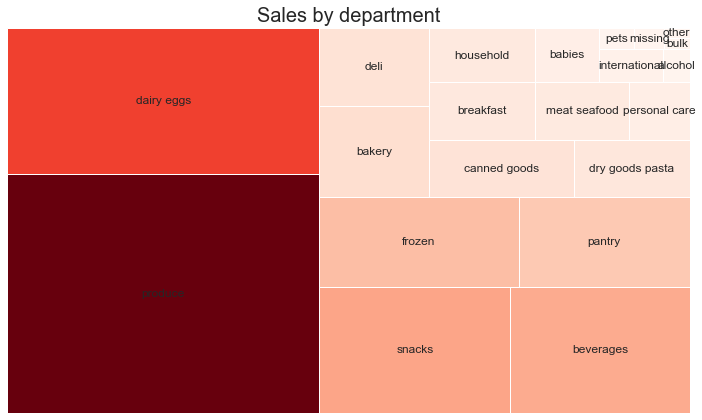

In [48]:
cmap = matplotlib.cm.Reds
mini = min(cluster_4['department'].value_counts())
maxi = max(cluster_4['department'].value_counts())
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(i)) for i in cluster_4['department'].value_counts()]



plt.figure(figsize=(10, 6))
squarify.plot(sizes=cluster_4['department'].value_counts(), label=cluster_4['department'].value_counts().index, color=colors);
plt.title('Sales by department', fontsize=20)
plt.axis('off');
plt.tight_layout()

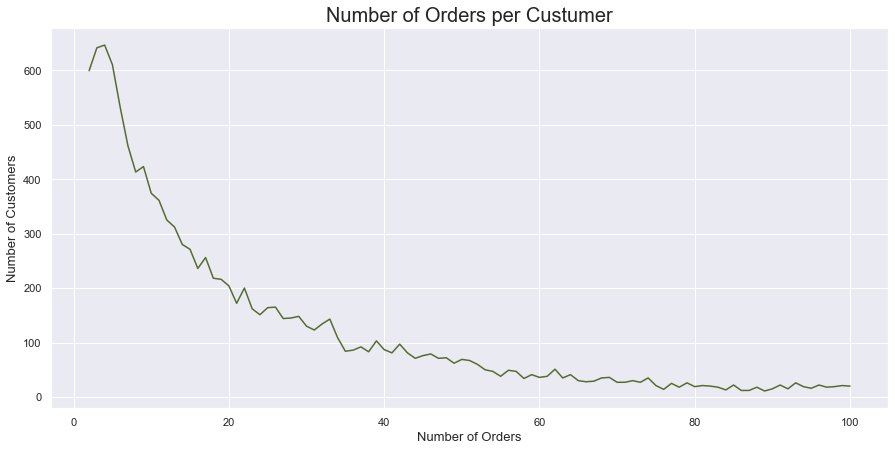

In [49]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_4.groupby("user_id")["order_number"].aggregate(np.max).reset_index()["order_number"].value_counts()

sns.lineplot(x=plot_data.index,
                 y=plot_data.values,
                 color="darkolivegreen")

plt.ylabel('Number of Customers', fontsize=13)
plt.xlabel('Number of Orders', fontsize=13)

plt.title("Number of Orders per Custumer", fontsize=20)
plt.show()

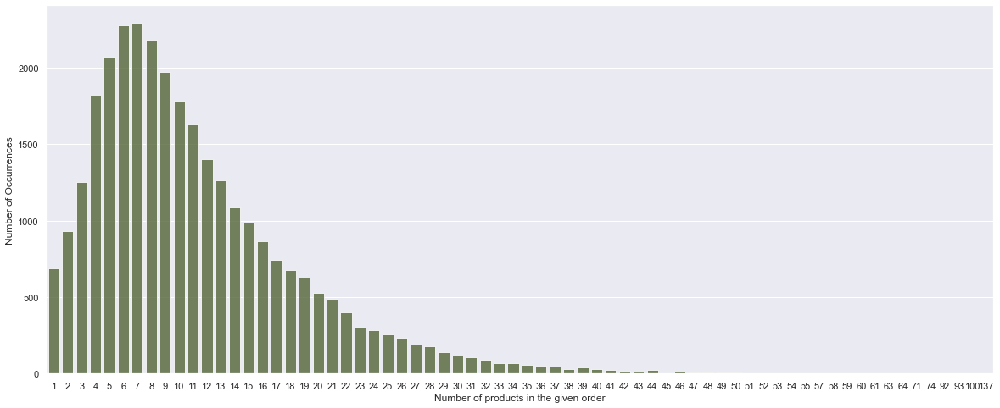

In [50]:
#No. of products per order on an average
grouped_df = cluster_4.groupby("order_id")["add_to_cart_order"].aggregate("max").reset_index()
cnt_srs = grouped_df.add_to_cart_order.value_counts()

plt.figure(figsize=(20,8))
sns.barplot(x = cnt_srs.index, y = cnt_srs.values, alpha=0.8, color = 'darkolivegreen')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Number of products in the given order', fontsize=12)
#plt.xticks(rotation='vertical')
plt.show()

### Customer General Behavior

1. Time of day Preferences
2. Hour Preferences
3. Time between orders by the given customer

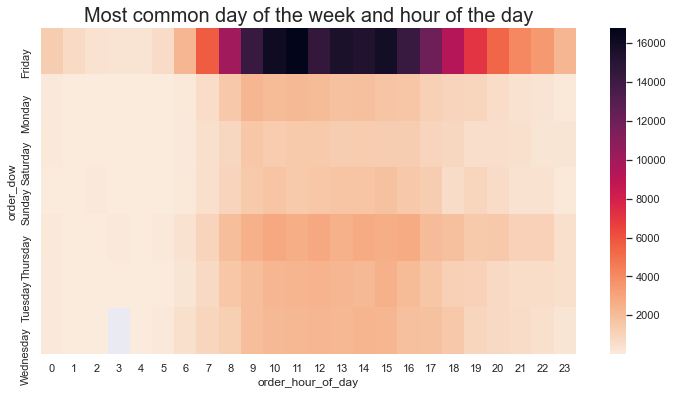

In [51]:
plot_data = cluster_4.groupby(["order_dow", "order_hour_of_day"])["order_number"].agg("count").reset_index()
plot_data = plot_data.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(plot_data,cmap=sns.color_palette("rocket_r", as_cmap=True))
plt.title("Most common day of the week and hour of the day", fontsize=20)
plt.show()

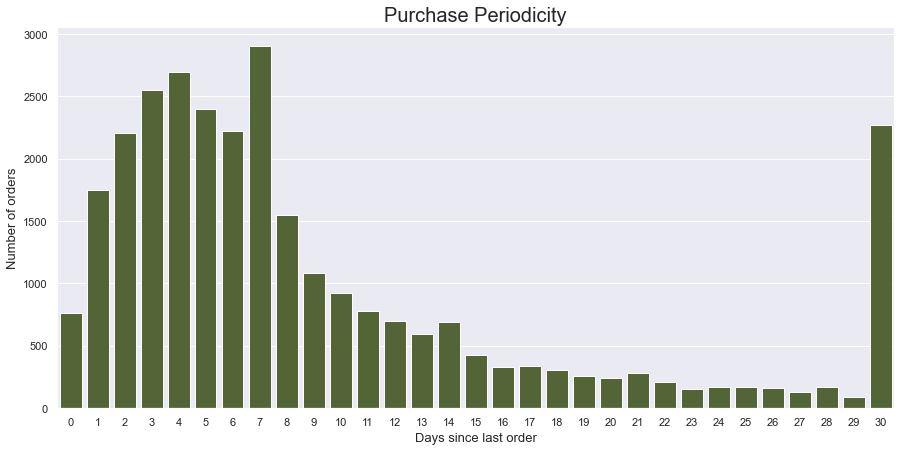

In [52]:
f, ax = plt.subplots(figsize=(15, 7))
plot_data = cluster_4.groupby('order_id')['days_since_prior_order'].mean().reset_index()['days_since_prior_order'].value_counts()

sns.barplot(x=plot_data.index,
                 y=plot_data.values,
                 color="darkolivegreen",
           )
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
plt.ylabel('Number of orders', fontsize=13)
plt.xlabel('Days since last order', fontsize=13)

plt.title("Purchase Periodicity", fontsize=20)
plt.show()

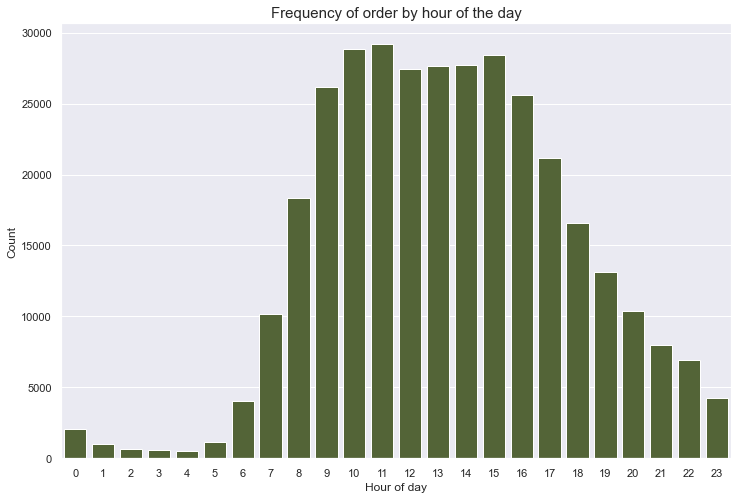

order_hour_of_day
0      183
1       94
2       58
3       51
4       44
5       97
6      330
7      886
8     1610
9     2313
10    2607
11    2535
12    2399
13    2460
14    2481
15    2593
16    2384
17    1965
18    1592
19    1238
20     915
21     659
22     552
23     376
Name: order_id, dtype: int64

In [53]:
#Figuring out which time of the day is the busiest
plt.figure(figsize=(12,8))
sns.countplot(x="order_hour_of_day", data=cluster_4, color='darkolivegreen')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.title("Frequency of order by hour of the day", fontsize=15)
plt.show()
cnt_hod = cluster_4.groupby('order_hour_of_day')['order_id'].aggregate(get_unique_count)
cnt_hod

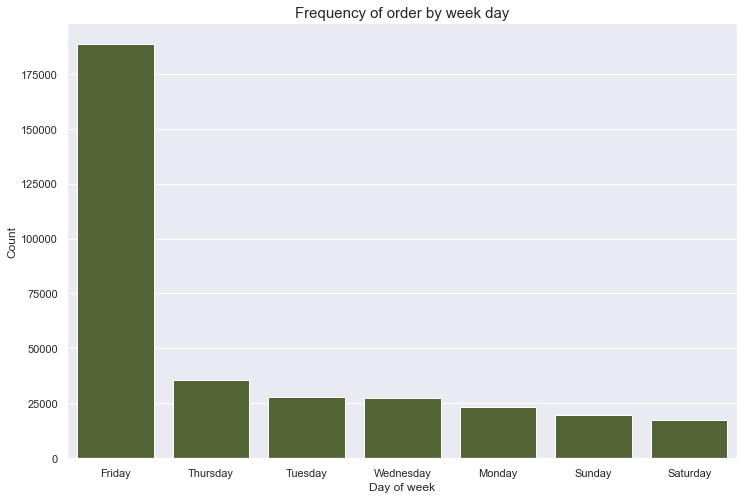

order_dow
Friday       15248
Monday        2490
Saturday      1837
Sunday        2062
Thursday      3338
Tuesday       2778
Wednesday     2669
Name: order_id, dtype: int64

In [54]:
#Finding out the busiest day of the week
plt.figure(figsize=(12,8))
sns.countplot(x="order_dow", data=cluster_4, order=cluster_4['order_dow'].value_counts().index, color='darkolivegreen')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Frequency of order by week day", fontsize=15)
plt.show()
cnt_dow = cluster_4.groupby('order_dow')['order_id'].aggregate(get_unique_count)
cnt_dow

<b>12181 customers with 30422 orders.

Overall observations:

Weekly buyers Reasonable lenght of purchase: 5 to 15 items at a time

Proneness to make purchases on Friday 9 and 17.

Top 6 departments: Produce, Dairy Eggs, Snacks, Beverages, Frozen, Pantry

## Cluster Specific association rules:

The most significant difference between different groups of customers seems to be the preferred day of the week.
There are some minor differences in preffered department from group to group - The top 6 sought after departments are always the same, even if the preferences in 3rd to 6th place may vary from customer type to customer type.

We will now look for intra-cluster association rules and compare the results with the results obtained for the general population.


We will start with a general overview of each cluster with some Exploration. Down below we'll go into more detail on the product associations.

### Cluster 0 - The Occasional Buyers

In [55]:
comp_ord = cluster_0[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pt

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
150,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
172,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
205,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
243,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3420952,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3420977,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
frequent_itemsets = apriori(pt, min_support=0.03, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.030620,(asian foods)
1,0.055135,(baking ingredients)
2,0.104981,(bread)
3,0.044793,(breakfast bakery)
4,0.049761,(butter)
...,...,...
140,0.030721,"(fresh vegetables, soy lactosefree, packaged v..."
141,0.046133,"(yogurt, fresh vegetables, packaged vegetables..."
142,0.031603,"(fresh fruits, milk, fresh vegetables, package..."
143,0.035689,"(fresh fruits, fresh vegetables, packaged chee..."


In [57]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='lift', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
165,(fresh herbs),"(fresh fruits, fresh vegetables)",0.058781,0.201197,0.035740,0.608018,3.022006,0.023913,2.037859,frozenset({'fresh herbs'})-->frozenset({'fresh...
164,"(fresh fruits, fresh vegetables)",(fresh herbs),0.201197,0.058781,0.035740,0.177635,3.022006,0.023913,1.144528,"frozenset({'fresh fruits', 'fresh vegetables'}..."
312,"(fresh fruits, packaged vegetables fruits)","(yogurt, fresh vegetables)",0.176037,0.078600,0.039063,0.221901,2.823161,0.025226,1.184168,"frozenset({'fresh fruits', 'packaged vegetable..."
309,"(yogurt, fresh vegetables)","(fresh fruits, packaged vegetables fruits)",0.078600,0.176037,0.039063,0.496980,2.823161,0.025226,1.638033,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
167,(fresh vegetables),"(fresh herbs, fresh fruits)",0.309213,0.041335,0.035740,0.115583,2.796271,0.022959,1.083952,frozenset({'fresh vegetables'})-->frozenset({'...
...,...,...,...,...,...,...,...,...,...,...
200,"(fresh fruits, fresh vegetables)",(water seltzer sparkling water),0.201197,0.172425,0.034655,0.172242,0.998938,-0.000037,0.999779,"frozenset({'fresh fruits', 'fresh vegetables'}..."
81,(fresh fruits),(water seltzer sparkling water),0.416805,0.172425,0.068750,0.164945,0.956614,-0.003118,0.991042,frozenset({'fresh fruits'})-->frozenset({'wate...
80,(water seltzer sparkling water),(fresh fruits),0.172425,0.416805,0.068750,0.398722,0.956614,-0.003118,0.969925,frozenset({'water seltzer sparkling water'})--...
105,(fresh vegetables),(water seltzer sparkling water),0.309213,0.172425,0.048405,0.156541,0.907878,-0.004912,0.981168,frozenset({'fresh vegetables'})-->frozenset({'...


In [58]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(
    x = rulesConfidence['support'],
    y = rulesConfidence['confidence'],
    mode='markers',
    hovertext = rulesConfidence['rule'],
    marker=dict(
        size=16,
        color = rulesConfidence['lift'], #set color equal to a variable
        colorscale='OrRd', # one of plotly colorscales
        showscale=True, 
    )), 
    layout=go.Layout(
        xaxis=dict(autorange = True,
            title=dict(text="Support")),
        yaxis=dict(autorange = True, visible=True, showticklabels=True,
            title = dict(text="Confidence")),
        title=dict(text='Support, Confidence and Lift in Occasional Buyers',
                   x=0.5, xanchor='center')))

fig.show()

In [59]:
# Generate the association rules - by lift
rulesLift = association_rules(frequent_itemsets, metric="lift", min_threshold=0)
rulesLift.sort_values(by='lift', ascending=False, inplace=True)
rulesLift.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
165,(fresh herbs),"(fresh fruits, fresh vegetables)",0.058781,0.201197,0.035740,0.608018,3.022006,0.023913,2.037859
164,"(fresh fruits, fresh vegetables)",(fresh herbs),0.201197,0.058781,0.035740,0.177635,3.022006,0.023913,1.144528
312,"(fresh fruits, packaged vegetables fruits)","(yogurt, fresh vegetables)",0.176037,0.078600,0.039063,0.221901,2.823161,0.025226,1.184168
309,"(yogurt, fresh vegetables)","(fresh fruits, packaged vegetables fruits)",0.078600,0.176037,0.039063,0.496980,2.823161,0.025226,1.638033
167,(fresh vegetables),"(fresh herbs, fresh fruits)",0.309213,0.041335,0.035740,0.115583,2.796271,0.022959,1.083952


In [60]:
# Add a column with the length
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

# Length>=2 and Support>=0.2
frequent_itemsets[(frequent_itemsets['length'] >= 2) & (frequent_itemsets['support'] >= 0.2)]

,support,itemsets,length
76,0.201197,"(fresh fruits, fresh vegetables)",2


In [61]:
# High Confidence and high Lift - complementary products
rulesConfidence[(rulesConfidence['confidence'] >= 0.75) & (rulesConfidence['lift'] >= 1.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
162,"(fresh herbs, fresh fruits)",(fresh vegetables),0.041335,0.309213,0.035740,0.864643,2.796271,0.022959,5.103451,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
84,(fresh herbs),(fresh vegetables),0.058781,0.309213,0.047845,0.813960,2.632361,0.029669,3.713114,frozenset({'fresh herbs'})-->frozenset({'fresh...
306,"(yogurt, fresh vegetables, packaged vegetables...",(fresh fruits),0.046133,0.416805,0.039063,0.846748,2.031519,0.019834,3.805451,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
279,"(milk, fresh vegetables, packaged vegetables f...",(fresh fruits),0.038113,0.416805,0.031603,0.829181,1.989375,0.015717,3.414120,"frozenset({'milk', 'fresh vegetables', 'packag..."
293,"(packaged cheese, fresh vegetables, packaged v...",(fresh fruits),0.044183,0.416805,0.035689,0.807751,1.937959,0.017273,3.033545,"frozenset({'packaged cheese', 'fresh vegetable..."
247,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.069818,0.416805,0.055746,0.798446,1.915633,0.026645,2.893490,"frozenset({'yogurt', 'packaged vegetables frui..."
205,"(yogurt, fresh vegetables)",(fresh fruits),0.078600,0.416805,0.061748,0.785591,1.884792,0.028987,2.720012,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
236,"(soy lactosefree, packaged vegetables fruits)",(fresh fruits),0.045217,0.416805,0.035435,0.783652,1.880140,0.016588,2.695634,"frozenset({'soy lactosefree', 'packaged vegeta..."
212,"(milk, packaged vegetables fruits)",(fresh fruits),0.059188,0.416805,0.045878,0.775136,1.859709,0.021209,2.593546,"frozenset({'milk', 'packaged vegetables fruits..."
139,"(bread, packaged vegetables fruits)",(fresh fruits),0.042555,0.416805,0.032688,0.768127,1.842894,0.014951,2.515153,"frozenset({'bread', 'packaged vegetables fruit..."


In [62]:
# Substitue products
rulesLift2 = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0)
rulesLift2.sort_values(by='lift', ascending=True, inplace=True)
rulesLift2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
104,(water seltzer sparkling water),(fresh vegetables),0.172425,0.309213,0.048405,0.280728,0.907878,-0.004912,0.960397
105,(fresh vegetables),(water seltzer sparkling water),0.309213,0.172425,0.048405,0.156541,0.907878,-0.004912,0.981168
80,(water seltzer sparkling water),(fresh fruits),0.172425,0.416805,0.068750,0.398722,0.956614,-0.003118,0.969925
81,(fresh fruits),(water seltzer sparkling water),0.416805,0.172425,0.068750,0.164945,0.956614,-0.003118,0.991042
200,"(fresh fruits, fresh vegetables)",(water seltzer sparkling water),0.201197,0.172425,0.034655,0.172242,0.998938,-0.000037,0.999779
201,(water seltzer sparkling water),"(fresh fruits, fresh vegetables)",0.172425,0.201197,0.034655,0.200983,0.998938,-0.000037,0.999733
124,(water seltzer sparkling water),(packaged vegetables fruits),0.172425,0.258825,0.044997,0.260964,1.008264,0.000369,1.002894
125,(packaged vegetables fruits),(water seltzer sparkling water),0.258825,0.172425,0.044997,0.173850,1.008264,0.000369,1.001725
243,(water seltzer sparkling water),"(fresh fruits, packaged vegetables fruits)",0.172425,0.176037,0.032111,0.186234,1.057927,0.001758,1.012531
242,"(fresh fruits, packaged vegetables fruits)",(water seltzer sparkling water),0.176037,0.172425,0.032111,0.182414,1.057927,0.001758,1.012217


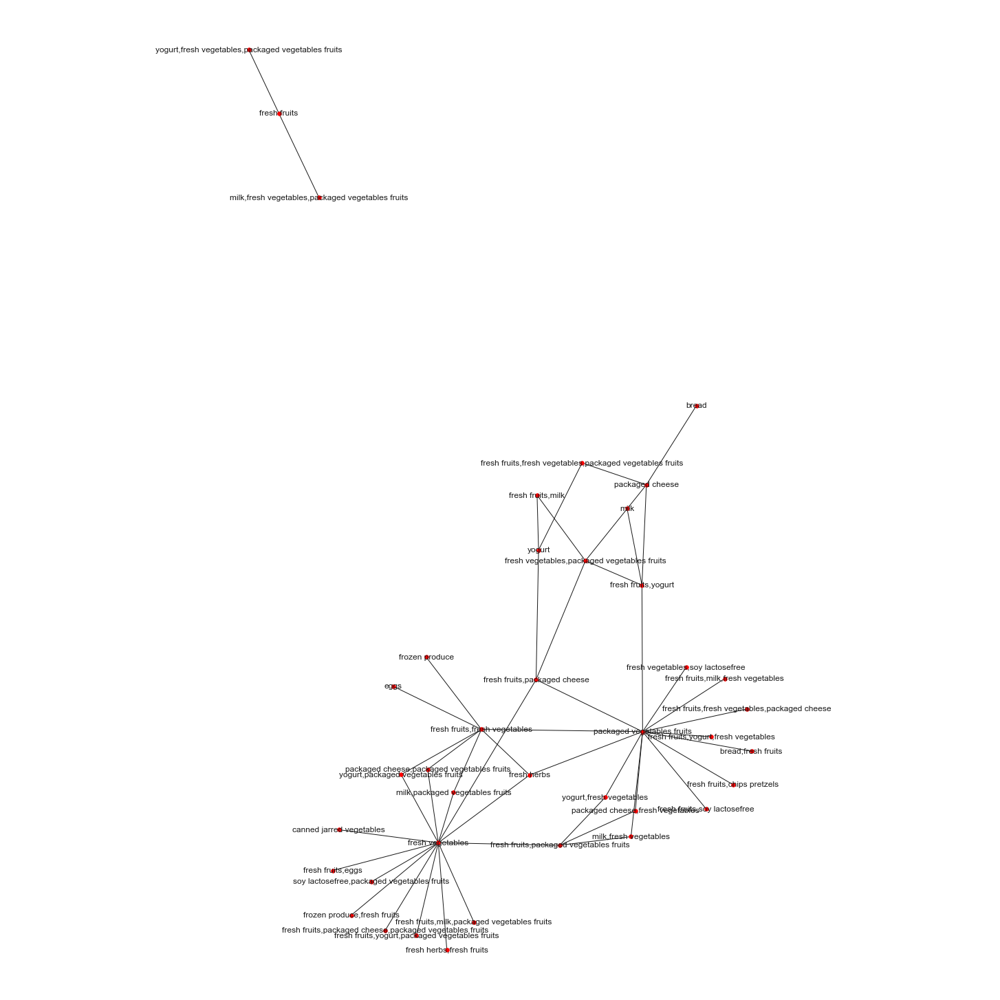

In [63]:
### Plot a basic network graph of the top 50 confidence rules
# Create a copy of the rules and transform the frozensets to strings
rulesToPlot = rulesConfidence.copy(deep=True)
rulesToPlot['LHS'] = [','.join(list(x)) for x in rulesToPlot['antecedents']]
rulesToPlot['RHS'] = [','.join(list(x)) for x in rulesToPlot['consequents']]
# Remove duplicate if reversed rules
rulesToPlot['sortedRow'] = [sorted([a,b]) for a,b in zip(rulesToPlot.LHS, rulesToPlot.RHS)]
rulesToPlot['sortedRow'] = rulesToPlot['sortedRow'].astype(str)
rulesToPlot.drop_duplicates(subset=['sortedRow'], inplace=True)
# Plot
rulesToPlot=rulesToPlot[:50]
fig = plt.figure(figsize=(20, 20)) 
G = nx.from_pandas_edgelist(rulesToPlot, 'LHS', 'RHS')  
# Each node is an itemset (either source or target) and the edges connect the itemsets if they consist of a high confidence rule
nx.draw(G, with_labels=True, node_size=30, node_color="red", pos=nx.spring_layout(G))
plt.axis('equal')
plt.show()
#fig.savefig('figure.svg')
# TRY TO PLOT THE DIRECTION OF SOURCE -> TARGET

### Cluster 1 - Monday Weekly Purchasers 

In [64]:
comp_ord = cluster_1[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pt

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
62,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
565,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
718,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420910,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3420959,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3420968,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 5% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
frequent_itemsets = apriori(pt, min_support=0.05, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.055101,(baby food formula)
1,0.080586,(baking ingredients)
2,0.185416,(bread)
3,0.080748,(breakfast bakery)
4,0.078886,(butter)
...,...,...
201,0.057099,"(yogurt, fresh fruits, fresh vegetables, packa..."
202,0.057693,"(fresh fruits, fresh vegetables, soy lactosefr..."
203,0.087606,"(yogurt, fresh fruits, fresh vegetables, packa..."
204,0.053886,"(yogurt, fresh fruits, milk, packaged vegetabl..."


In [66]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='lift', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
288,"(fresh fruits, fresh vegetables)",(fresh herbs),0.346076,0.095435,0.063956,0.184804,1.936441,0.030928,1.109629,"frozenset({'fresh fruits', 'fresh vegetables'}..."
289,(fresh herbs),"(fresh fruits, fresh vegetables)",0.095435,0.346076,0.063956,0.670156,1.936441,0.030928,1.982523,frozenset({'fresh herbs'})-->frozenset({'fresh...
615,"(fresh fruits, packaged cheese)","(yogurt, packaged vegetables fruits)",0.184687,0.152372,0.052617,0.284900,1.869769,0.024476,1.185328,"frozenset({'fresh fruits', 'packaged cheese'})..."
614,"(yogurt, packaged vegetables fruits)","(fresh fruits, packaged cheese)",0.152372,0.184687,0.052617,0.345322,1.869769,0.024476,1.245365,"frozenset({'yogurt', 'packaged vegetables frui..."
291,(fresh vegetables),"(fresh herbs, fresh fruits)",0.469723,0.073000,0.063956,0.136157,1.865163,0.029666,1.073112,frozenset({'fresh vegetables'})-->frozenset({'...
...,...,...,...,...,...,...,...,...,...,...
30,(chips pretzels),(fresh vegetables),0.192948,0.469723,0.089333,0.462991,0.985670,-0.001299,0.987465,frozenset({'chips pretzels'})-->frozenset({'fr...
468,"(fresh vegetables, packaged vegetables fruits)",(water seltzer sparkling water),0.255771,0.205502,0.051402,0.200971,0.977952,-0.001159,0.994329,"frozenset({'fresh vegetables', 'packaged veget..."
469,(water seltzer sparkling water),"(fresh vegetables, packaged vegetables fruits)",0.205502,0.255771,0.051402,0.250131,0.977952,-0.001159,0.992480,frozenset({'water seltzer sparkling water'})--...
141,(fresh vegetables),(water seltzer sparkling water),0.469723,0.205502,0.090764,0.193229,0.940280,-0.005765,0.984788,frozenset({'fresh vegetables'})-->frozenset({'...


In [67]:
fig = go.Figure(data=go.Scatter(
    x = rulesConfidence['support'],
    y = rulesConfidence['confidence'],
    mode='markers',
    hovertext = rulesConfidence['rule'],
    marker=dict(
        size=16,
        color = rulesConfidence['lift'], #set color equal to a variable
        colorscale='OrRd', # one of plotly colorscales
        showscale=True, 
    )), 
    layout=go.Layout(
        xaxis=dict(autorange = True,
            title=dict(text="Support")),
        yaxis=dict(autorange = True, visible=True, showticklabels=True,
            title = dict(text="Confidence")),
        title=dict(text='Support, Confidence and Lift on Monday Buyers',
                   x=0.5, xanchor='center')))

fig.show()

In [68]:
# Generate the association rules - by lift
rulesLift = association_rules(frequent_itemsets, metric="lift", min_threshold=1.5)
rulesLift.sort_values(by='lift', ascending=False, inplace=True)
rulesLift.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
27,"(fresh fruits, fresh vegetables)",(fresh herbs),0.346076,0.095435,0.063956,0.184804,1.936441,0.030928,1.109629
28,(fresh herbs),"(fresh fruits, fresh vegetables)",0.095435,0.346076,0.063956,0.670156,1.936441,0.030928,1.982523
130,"(fresh fruits, packaged cheese)","(yogurt, packaged vegetables fruits)",0.184687,0.152372,0.052617,0.284900,1.869769,0.024476,1.185328
129,"(yogurt, packaged vegetables fruits)","(fresh fruits, packaged cheese)",0.152372,0.184687,0.052617,0.345322,1.869769,0.024476,1.245365
26,"(fresh herbs, fresh fruits)",(fresh vegetables),0.073000,0.469723,0.063956,0.876109,1.865163,0.029666,4.280208


In [69]:
# Add a column with the length
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

# Length=2 and Support>=0.2
frequent_itemsets[(frequent_itemsets['length'] >= 2) & (frequent_itemsets['support'] >= 0.2)]

,support,itemsets,length
93,0.346076,"(fresh fruits, fresh vegetables)",2
99,0.201614,"(fresh fruits, milk)",2
103,0.306417,"(fresh fruits, packaged vegetables fruits)",2
109,0.229232,"(yogurt, fresh fruits)",2
119,0.255771,"(fresh vegetables, packaged vegetables fruits)",2
167,0.206042,"(fresh fruits, fresh vegetables, packaged vege...",3


In [70]:
# High Confidence and high Lift - complementary products
rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
289,(fresh herbs),"(fresh fruits, fresh vegetables)",0.095435,0.346076,0.063956,0.670156,1.936441,0.030928,1.982523,frozenset({'fresh herbs'})-->frozenset({'fresh...
286,"(fresh herbs, fresh fruits)",(fresh vegetables),0.073000,0.469723,0.063956,0.876109,1.865163,0.029666,4.280208,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
114,(fresh herbs),(fresh vegetables),0.095435,0.469723,0.081396,0.852900,1.815751,0.036568,3.604866,frozenset({'fresh herbs'})-->frozenset({'fresh...


In [71]:
# Substitue products
rulesLift2 = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0)
rulesLift2.sort_values(by='lift', ascending=True, inplace=True)
rulesLift2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
140,(water seltzer sparkling water),(fresh vegetables),0.205502,0.469723,0.090764,0.441671,0.940280,-0.005765,0.949758
141,(fresh vegetables),(water seltzer sparkling water),0.469723,0.205502,0.090764,0.193229,0.940280,-0.005765,0.984788
469,(water seltzer sparkling water),"(fresh vegetables, packaged vegetables fruits)",0.205502,0.255771,0.051402,0.250131,0.977952,-0.001159,0.992480
468,"(fresh vegetables, packaged vegetables fruits)",(water seltzer sparkling water),0.255771,0.205502,0.051402,0.200971,0.977952,-0.001159,0.994329
30,(chips pretzels),(fresh vegetables),0.192948,0.469723,0.089333,0.462991,0.985670,-0.001299,0.987465
31,(fresh vegetables),(chips pretzels),0.469723,0.192948,0.089333,0.190183,0.985670,-0.001299,0.996586
157,(soy lactosefree),(milk),0.197754,0.280743,0.054804,0.277133,0.987142,-0.000714,0.995006
156,(milk),(soy lactosefree),0.280743,0.197754,0.054804,0.195211,0.987142,-0.000714,0.996840
337,(water seltzer sparkling water),"(fresh fruits, fresh vegetables)",0.205502,0.346076,0.070759,0.344325,0.994940,-0.000360,0.997329
336,"(fresh fruits, fresh vegetables)",(water seltzer sparkling water),0.346076,0.205502,0.070759,0.204462,0.994940,-0.000360,0.998693


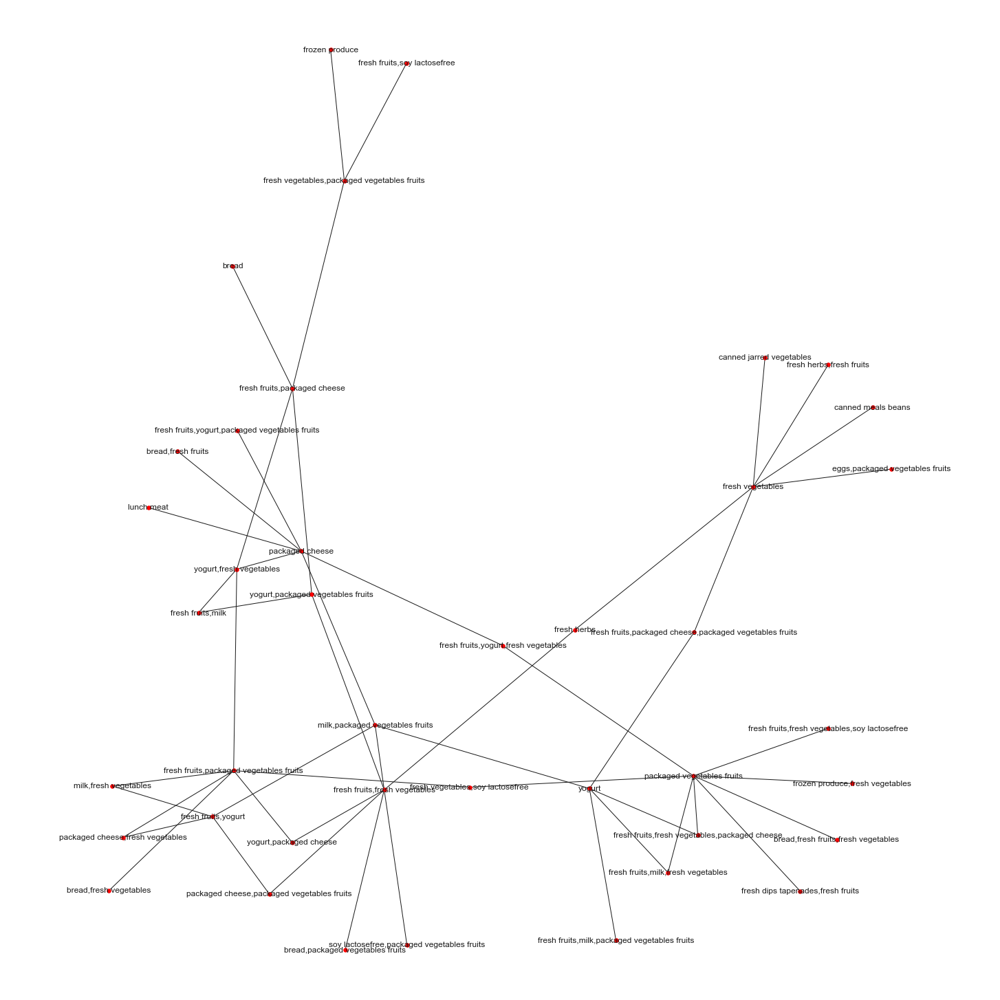

In [72]:
### Plot a basic network graph of the top 50 confidence rules
# Create a copy of the rules and transform the frozensets to strings
rulesToPlot = rulesConfidence.copy(deep=True)
rulesToPlot['LHS'] = [','.join(list(x)) for x in rulesToPlot['antecedents']]
rulesToPlot['RHS'] = [','.join(list(x)) for x in rulesToPlot['consequents']]
# Remove duplicate if reversed rules
rulesToPlot['sortedRow'] = [sorted([a,b]) for a,b in zip(rulesToPlot.LHS, rulesToPlot.RHS)]
rulesToPlot['sortedRow'] = rulesToPlot['sortedRow'].astype(str)
rulesToPlot.drop_duplicates(subset=['sortedRow'], inplace=True)
# Plot
rulesToPlot=rulesToPlot[:50]
fig = plt.figure(figsize=(20, 20)) 
G = nx.from_pandas_edgelist(rulesToPlot, 'LHS', 'RHS')  
# Each node is an itemset (either source or target) and the edges connect the itemsets if they consist of a high confidence rule
nx.draw(G, with_labels=True, node_size=30, node_color="red", pos=nx.spring_layout(G))
plt.axis('equal')
plt.show()
#fig.savefig('figure.svg')
# TRY TO PLOT THE DIRECTION OF SOURCE -> TARGET

### Cluster 2 - Sunday Weekly Purchasers 

In [73]:
comp_ord = cluster_2[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pt

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
56,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
140,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
147,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
527,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420240,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3420610,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3420861,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [74]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 5% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
frequent_itemsets = apriori(pt, min_support=0.05, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.050703,(asian foods)
1,0.056054,(baby food formula)
2,0.084459,(baking ingredients)
3,0.197027,(bread)
4,0.076297,(breakfast bakery)
...,...,...
253,0.051189,"(fresh fruits, milk, packaged cheese, packaged..."
254,0.061351,"(yogurt, fresh fruits, milk, packaged vegetabl..."
255,0.061595,"(yogurt, fresh fruits, packaged cheese, packag..."
256,0.051946,"(yogurt, milk, fresh vegetables, packaged vege..."


In [75]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='lift', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
874,"(milk, packaged vegetables fruits)","(yogurt, fresh vegetables)",0.138838,0.194432,0.051946,0.374148,1.924310,0.024951,1.287154,"frozenset({'milk', 'packaged vegetables fruits..."
871,"(yogurt, fresh vegetables)","(milk, packaged vegetables fruits)",0.194432,0.138838,0.051946,0.267167,1.924310,0.024951,1.175114,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
693,"(fresh vegetables, packaged vegetables fruits)","(fresh herbs, fresh fruits)",0.305486,0.092027,0.053730,0.175883,1.911205,0.025617,1.101752,"frozenset({'fresh vegetables', 'packaged veget..."
688,"(fresh herbs, fresh fruits)","(fresh vegetables, packaged vegetables fruits)",0.092027,0.305486,0.053730,0.583847,1.911205,0.025617,1.668891,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
691,"(fresh fruits, fresh vegetables)","(fresh herbs, packaged vegetables fruits)",0.409622,0.069027,0.053730,0.131169,1.900258,0.025455,1.071524,"frozenset({'fresh fruits', 'fresh vegetables'}..."
...,...,...,...,...,...,...,...,...,...,...
38,(cereal),(fresh vegetables),0.104324,0.549892,0.056459,0.541192,0.984178,-0.000908,0.981037,frozenset({'cereal'})-->frozenset({'fresh vege...
404,"(fresh fruits, fresh vegetables)",(ice cream ice),0.409622,0.124757,0.050270,0.122724,0.983704,-0.000833,0.997683,"frozenset({'fresh fruits', 'fresh vegetables'}..."
405,(ice cream ice),"(fresh fruits, fresh vegetables)",0.124757,0.409622,0.050270,0.402946,0.983704,-0.000833,0.988820,frozenset({'ice cream ice'})-->frozenset({'fre...
151,(fresh vegetables),(ice cream ice),0.549892,0.124757,0.066703,0.121301,0.972304,-0.001900,0.996068,frozenset({'fresh vegetables'})-->frozenset({'...


In [76]:
fig = go.Figure(data=go.Scatter(
    x = rulesConfidence['support'],
    y = rulesConfidence['confidence'],
    mode='markers',
    hovertext = rulesConfidence['rule'],
    marker=dict(
        size=16,
        color = rulesConfidence['lift'], #set color equal to a variable
        colorscale='OrRd', # one of plotly colorscales
        showscale=True, 
    )), 
    layout=go.Layout(
        xaxis=dict(autorange = True,
            title=dict(text="Support")),
        yaxis=dict(autorange = True, visible=True, showticklabels=True,
            title = dict(text="Confidence")),
        title=dict(text='Support, Confidence and Lift on Sunday Purchasers',
                   x=0.5, xanchor='center')))

fig.show()

In [77]:
# Generate the association rules - by lift
rulesLift = association_rules(frequent_itemsets, metric="lift", min_threshold=1.5)
rulesLift.sort_values(by='lift', ascending=False, inplace=True)
rulesLift.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
144,"(milk, packaged vegetables fruits)","(yogurt, fresh vegetables)",0.138838,0.194432,0.051946,0.374148,1.924310,0.024951,1.287154
141,"(yogurt, fresh vegetables)","(milk, packaged vegetables fruits)",0.194432,0.138838,0.051946,0.267167,1.924310,0.024951,1.175114
55,"(fresh vegetables, packaged vegetables fruits)","(fresh herbs, fresh fruits)",0.305486,0.092027,0.053730,0.175883,1.911205,0.025617,1.101752
50,"(fresh herbs, fresh fruits)","(fresh vegetables, packaged vegetables fruits)",0.092027,0.305486,0.053730,0.583847,1.911205,0.025617,1.668891
53,"(fresh fruits, fresh vegetables)","(fresh herbs, packaged vegetables fruits)",0.409622,0.069027,0.053730,0.131169,1.900258,0.025455,1.071524


In [78]:
# Add a column with the length
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

# Length=2 and Support>=0.2
frequent_itemsets[(frequent_itemsets['length'] >= 2) & (frequent_itemsets['support'] >= 0.2)]

,support,itemsets,length
104,0.409622,"(fresh fruits, fresh vegetables)",2
112,0.200865,"(fresh fruits, milk)",2
116,0.201135,"(fresh fruits, packaged cheese)",2
117,0.338243,"(fresh fruits, packaged vegetables fruits)",2
125,0.239054,"(yogurt, fresh fruits)",2
138,0.305486,"(fresh vegetables, packaged vegetables fruits)",2
205,0.248838,"(fresh fruits, fresh vegetables, packaged vege...",3


In [79]:
# High Confidence and high Lift - complementary products
rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
688,"(fresh herbs, fresh fruits)","(fresh vegetables, packaged vegetables fruits)",0.092027,0.305486,0.05373,0.583847,1.911205,0.025617,1.668891,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
690,"(fresh herbs, packaged vegetables fruits)","(fresh fruits, fresh vegetables)",0.069027,0.409622,0.05373,0.778387,1.900258,0.025455,2.664004,"frozenset({'fresh herbs', 'packaged vegetables..."


In [80]:
# Substitue products
rulesLift2 = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0)
rulesLift2.sort_values(by='lift', ascending=True, inplace=True)
rulesLift2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
150,(ice cream ice),(fresh vegetables),0.124757,0.549892,0.066703,0.534662,0.972304,-0.001900,0.967271
151,(fresh vegetables),(ice cream ice),0.549892,0.124757,0.066703,0.121301,0.972304,-0.001900,0.996068
404,"(fresh fruits, fresh vegetables)",(ice cream ice),0.409622,0.124757,0.050270,0.122724,0.983704,-0.000833,0.997683
405,(ice cream ice),"(fresh fruits, fresh vegetables)",0.124757,0.409622,0.050270,0.402946,0.983704,-0.000833,0.988820
38,(cereal),(fresh vegetables),0.104324,0.549892,0.056459,0.541192,0.984178,-0.000908,0.981037
39,(fresh vegetables),(cereal),0.549892,0.104324,0.056459,0.102674,0.984178,-0.000908,0.998161
180,(water seltzer sparkling water),(fresh vegetables),0.200459,0.549892,0.108703,0.542268,0.986135,-0.001528,0.983344
181,(fresh vegetables),(water seltzer sparkling water),0.549892,0.200459,0.108703,0.197680,0.986135,-0.001528,0.996536
204,(water seltzer sparkling water),(milk),0.200459,0.277405,0.054919,0.273965,0.987599,-0.000690,0.995262
205,(milk),(water seltzer sparkling water),0.277405,0.200459,0.054919,0.197973,0.987599,-0.000690,0.996900


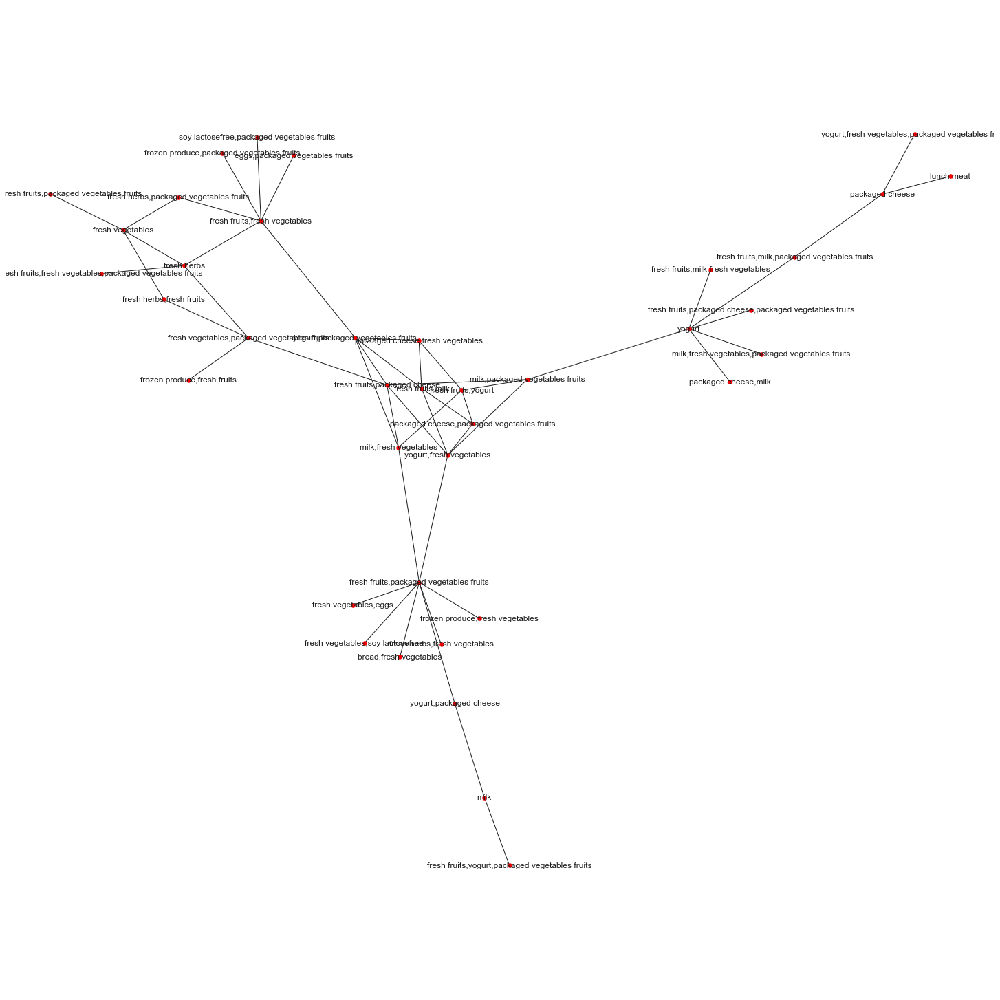

In [81]:
### Plot a basic network graph of the top 50 confidence rules
# Create a copy of the rules and transform the frozensets to strings
rulesToPlot = rulesConfidence.copy(deep=True)
rulesToPlot['LHS'] = [','.join(list(x)) for x in rulesToPlot['antecedents']]
rulesToPlot['RHS'] = [','.join(list(x)) for x in rulesToPlot['consequents']]
# Remove duplicate if reversed rules
rulesToPlot['sortedRow'] = [sorted([a,b]) for a,b in zip(rulesToPlot.LHS, rulesToPlot.RHS)]
rulesToPlot['sortedRow'] = rulesToPlot['sortedRow'].astype(str)
rulesToPlot.drop_duplicates(subset=['sortedRow'], inplace=True)
# Plot
rulesToPlot=rulesToPlot[:50]
fig = plt.figure(figsize=(20, 20)) 
G = nx.from_pandas_edgelist(rulesToPlot, 'LHS', 'RHS')  
# Each node is an itemset (either source or target) and the edges connect the itemsets if they consist of a high confidence rule
nx.draw(G, with_labels=True, node_size=30, node_color="red", pos=nx.spring_layout(G))
plt.axis('equal')
plt.show()
#fig.savefig('figure.svg')
# TRY TO PLOT THE DIRECTION OF SOURCE -> TARGET

### Cluster 3 - Saturday Weekly Purchasers

In [82]:
comp_ord = cluster_3[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pt

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
10,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
399,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
405,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420584,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3420760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3420771,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [83]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 5% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
frequent_itemsets = apriori(pt, min_support=0.03, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.052668,(asian foods)
1,0.050092,(baby food formula)
2,0.092060,(baking ingredients)
3,0.190177,(bread)
4,0.073488,(breakfast bakery)
...,...,...
568,0.049512,"(yogurt, packaged cheese, fresh vegetables, pa..."
569,0.030650,"(yogurt, fresh vegetables, soy lactosefree, pa..."
570,0.035801,"(fresh vegetables, packaged cheese, fresh frui..."
571,0.040480,"(yogurt, fresh vegetables, fresh fruits, milk,..."


In [84]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='lift', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
2518,"(yogurt, packaged vegetables fruits)","(fresh fruits, fresh vegetables, packaged cheese)",0.152200,0.129348,0.043817,0.287893,2.225723,0.024131,1.222642,"frozenset({'yogurt', 'packaged vegetables frui..."
2511,"(fresh fruits, fresh vegetables, packaged cheese)","(yogurt, packaged vegetables fruits)",0.129348,0.152200,0.043817,0.338755,2.225723,0.024131,1.282127,"frozenset({'fresh fruits', 'fresh vegetables',..."
2481,"(fresh fruits, milk, fresh vegetables)","(yogurt, packaged vegetables fruits)",0.120353,0.152200,0.040480,0.336347,2.209904,0.022163,1.277475,"frozenset({'fresh fruits', 'milk', 'fresh vege..."
2488,"(yogurt, packaged vegetables fruits)","(fresh fruits, milk, fresh vegetables)",0.152200,0.120353,0.040480,0.265968,2.209904,0.022163,1.198377,"frozenset({'yogurt', 'packaged vegetables frui..."
2445,"(fresh fruits, packaged cheese, fresh vegetables)","(milk, packaged vegetables fruits)",0.129348,0.125721,0.035801,0.276781,2.201549,0.019539,1.208871,"frozenset({'fresh fruits', 'packaged cheese', ..."
...,...,...,...,...,...,...,...,...,...,...
469,(packaged vegetables fruits),(soft drinks),0.414378,0.091625,0.031702,0.076506,0.834989,-0.006265,0.983628,frozenset({'packaged vegetables fruits'})-->fr...
430,(milk),(soy lactosefree),0.261743,0.194312,0.040226,0.153686,0.790923,-0.010634,0.951996,frozenset({'milk'})-->frozenset({'soy lactosef...
431,(soy lactosefree),(milk),0.194312,0.261743,0.040226,0.207019,0.790923,-0.010634,0.930989,frozenset({'soy lactosefree'})-->frozenset({'m...
344,(soft drinks),(fresh vegetables),0.091625,0.529580,0.038340,0.418448,0.790150,-0.010182,0.808904,frozenset({'soft drinks'})-->frozenset({'fresh...


In [85]:
fig = go.Figure(data=go.Scatter(
    x = rulesConfidence['support'],
    y = rulesConfidence['confidence'],
    mode='markers',
    hovertext = rulesConfidence['rule'],
    marker=dict(
        size=16,
        color = rulesConfidence['lift'], #set color equal to a variable
        colorscale='OrRd', # one of plotly colorscales
        showscale=True, 
    )), 
    layout=go.Layout(
        xaxis=dict(autorange = True,
            title=dict(text="Support")),
        yaxis=dict(autorange = True, visible=True, showticklabels=True,
            title = dict(text="Confidence")),
        title=dict(text='Support, Confidence and Lift on Saturday Purchasers',
                   x=0.5, xanchor='center')))

fig.show()

In [86]:
# Generate the association rules - by lift
rulesLift = association_rules(frequent_itemsets, metric="lift", min_threshold=1.5)
rulesLift.sort_values(by='lift', ascending=False, inplace=True)
rulesLift.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
712,"(yogurt, packaged vegetables fruits)","(fresh fruits, fresh vegetables, packaged cheese)",0.152200,0.129348,0.043817,0.287893,2.225723,0.024131,1.222642
705,"(fresh fruits, fresh vegetables, packaged cheese)","(yogurt, packaged vegetables fruits)",0.129348,0.152200,0.043817,0.338755,2.225723,0.024131,1.282127
679,"(fresh fruits, milk, fresh vegetables)","(yogurt, packaged vegetables fruits)",0.120353,0.152200,0.040480,0.336347,2.209904,0.022163,1.277475
686,"(yogurt, packaged vegetables fruits)","(fresh fruits, milk, fresh vegetables)",0.152200,0.120353,0.040480,0.265968,2.209904,0.022163,1.198377
647,"(fresh fruits, packaged cheese, fresh vegetables)","(milk, packaged vegetables fruits)",0.129348,0.125721,0.035801,0.276781,2.201549,0.019539,1.208871


In [87]:
# Add a column with the length
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

# Length=2 and Support>=0.2
frequent_itemsets[(frequent_itemsets['length'] >= 2) & (frequent_itemsets['support'] >= 0.2)]

,support,itemsets,length
177,0.381407,"(fresh fruits, fresh vegetables)",2
198,0.309442,"(fresh fruits, packaged vegetables fruits)",2
212,0.219087,"(yogurt, fresh fruits)",2
235,0.283724,"(fresh vegetables, packaged vegetables fruits)",2
420,0.226740,"(fresh fruits, fresh vegetables, packaged vege...",3


In [88]:
# High Confidence and high Lift - complementary products
rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
2011,"(fresh herbs, yogurt)","(fresh fruits, fresh vegetables)",0.041351,0.381407,0.031557,0.763158,2.000903,0.015786,2.611839,"frozenset({'fresh herbs', 'yogurt'})-->frozens..."
1996,"(fresh herbs, fresh fruits)","(fresh vegetables, packaged vegetables fruits)",0.091081,0.283724,0.051507,0.565512,1.993172,0.025665,1.648550,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
1998,"(fresh herbs, packaged vegetables fruits)","(fresh fruits, fresh vegetables)",0.067794,0.381407,0.051507,0.759765,1.992007,0.025650,2.574946,"frozenset({'fresh herbs', 'packaged vegetables..."
2506,"(yogurt, fresh vegetables, packaged cheese)","(fresh fruits, packaged vegetables fruits)",0.071675,0.309442,0.043817,0.611336,1.975609,0.021638,1.776749,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
1802,"(fresh fruits, canned jarred vegetables)","(fresh vegetables, packaged vegetables fruits)",0.060176,0.283724,0.032863,0.546112,1.924797,0.015790,1.578089,"frozenset({'fresh fruits', 'canned jarred vege..."
1815,"(fresh fruits, canned meals beans)","(fresh vegetables, packaged vegetables fruits)",0.063332,0.283724,0.034169,0.539519,1.901559,0.016200,1.555494,"frozenset({'fresh fruits', 'canned meals beans..."
1819,"(canned meals beans, packaged vegetables fruits)","(fresh fruits, fresh vegetables)",0.047553,0.381407,0.034169,0.718535,1.883909,0.016032,2.197767,"frozenset({'canned meals beans', 'packaged veg..."
2476,"(yogurt, milk, fresh vegetables)","(fresh fruits, packaged vegetables fruits)",0.069752,0.309442,0.040480,0.580343,1.875452,0.018896,1.645531,"frozenset({'yogurt', 'milk', 'fresh vegetables..."
2446,"(packaged cheese, milk, fresh vegetables)","(fresh fruits, packaged vegetables fruits)",0.062244,0.309442,0.035801,0.575175,1.858750,0.016540,1.625512,"frozenset({'packaged cheese', 'milk', 'fresh v..."
2508,"(fresh fruits, yogurt, packaged cheese)","(fresh vegetables, packaged vegetables fruits)",0.083790,0.283724,0.043817,0.522944,1.843139,0.020044,1.501449,"frozenset({'fresh fruits', 'yogurt', 'packaged..."


In [89]:
# Substitue products
rulesLift2 = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0)
rulesLift2.sort_values(by='lift', ascending=True, inplace=True)
rulesLift2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
345,(fresh vegetables),(soft drinks),0.529580,0.091625,0.038340,0.072397,0.790150,-0.010182,0.979272
344,(soft drinks),(fresh vegetables),0.091625,0.529580,0.038340,0.418448,0.790150,-0.010182,0.808904
431,(soy lactosefree),(milk),0.194312,0.261743,0.040226,0.207019,0.790923,-0.010634,0.930989
430,(milk),(soy lactosefree),0.261743,0.194312,0.040226,0.153686,0.790923,-0.010634,0.951996
469,(packaged vegetables fruits),(soft drinks),0.414378,0.091625,0.031702,0.076506,0.834989,-0.006265,0.983628
468,(soft drinks),(packaged vegetables fruits),0.091625,0.414378,0.031702,0.346002,0.834989,-0.006265,0.895448
272,(fresh fruits),(soft drinks),0.605281,0.091625,0.046574,0.076946,0.839797,-0.008885,0.984098
273,(soft drinks),(fresh fruits),0.091625,0.605281,0.046574,0.508314,0.839797,-0.008885,0.802785
336,(fresh vegetables),(paper goods),0.529580,0.072219,0.032718,0.061781,0.855467,-0.005528,0.988875
337,(paper goods),(fresh vegetables),0.072219,0.529580,0.032718,0.453039,0.855467,-0.005528,0.860060


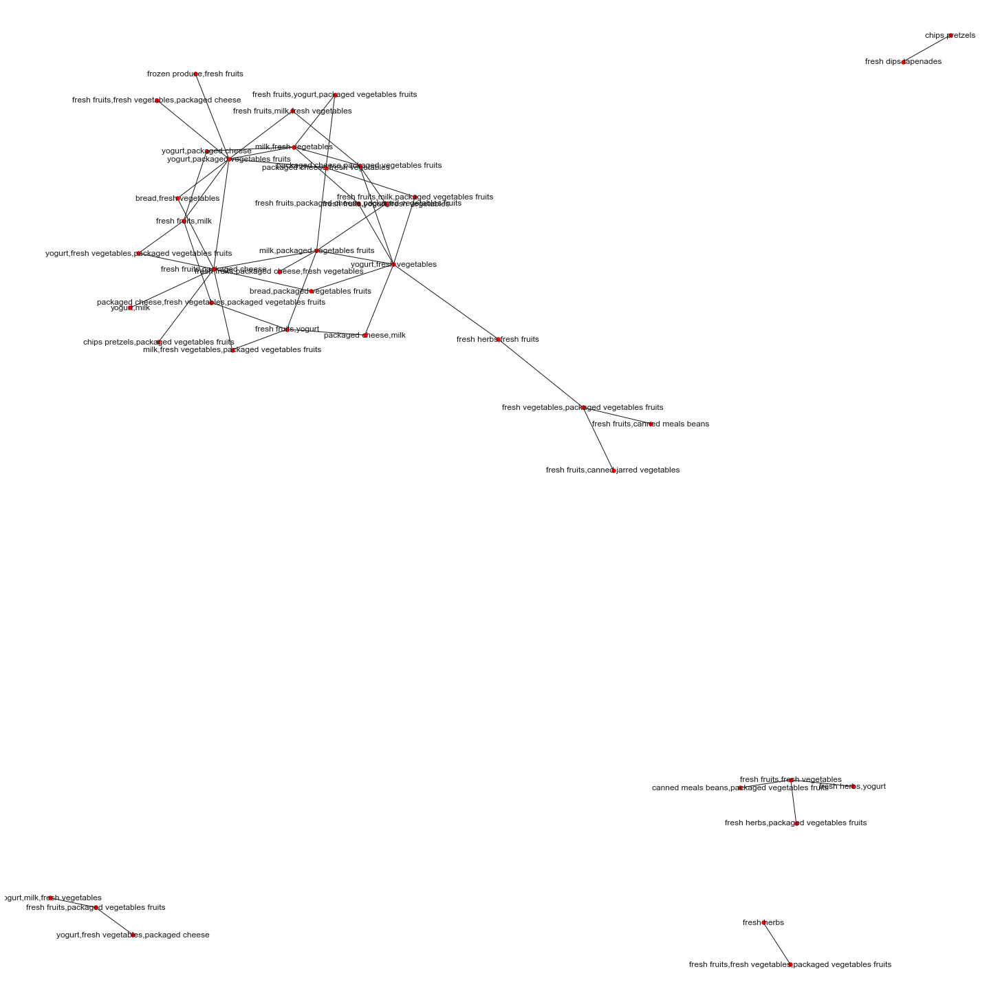

In [90]:
### Plot a basic network graph of the top 50 confidence rules
# Create a copy of the rules and transform the frozensets to strings
rulesToPlot = rulesConfidence.copy(deep=True)
rulesToPlot['LHS'] = [','.join(list(x)) for x in rulesToPlot['antecedents']]
rulesToPlot['RHS'] = [','.join(list(x)) for x in rulesToPlot['consequents']]
# Remove duplicate if reversed rules
rulesToPlot['sortedRow'] = [sorted([a,b]) for a,b in zip(rulesToPlot.LHS, rulesToPlot.RHS)]
rulesToPlot['sortedRow'] = rulesToPlot['sortedRow'].astype(str)
rulesToPlot.drop_duplicates(subset=['sortedRow'], inplace=True)
# Plot
rulesToPlot=rulesToPlot[:50]
fig = plt.figure(figsize=(20, 20)) 
G = nx.from_pandas_edgelist(rulesToPlot, 'LHS', 'RHS')  
# Each node is an itemset (either source or target) and the edges connect the itemsets if they consist of a high confidence rule
nx.draw(G, with_labels=True, node_size=30, node_color="red", pos=nx.spring_layout(G))
plt.axis('equal')
plt.show()
#fig.savefig('figure.svg')
# TRY TO PLOT THE DIRECTION OF SOURCE -> TARGET

#### Cluster 4 - Friday Buyers

In [91]:
comp_ord = cluster_4[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pt

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
122,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
192,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
207,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
372,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420503,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3420542,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
3420578,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [92]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 5% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
frequent_itemsets = apriori(pt, min_support=0.01, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.045954,(asian foods)
1,0.052331,(baby food formula)
2,0.011669,(bakery desserts)
3,0.090527,(baking ingredients)
4,0.187890,(bread)
...,...,...
3699,0.010289,"(yogurt, fresh vegetables, fresh fruits, packa..."
3700,0.010223,"(yogurt, fresh vegetables, frozen produce, fre..."
3701,0.010880,"(lunch meat, yogurt, fresh vegetables, fresh f..."
3702,0.018671,"(yogurt, fresh vegetables, fresh fruits, packa..."


In [93]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
29300,"(yogurt, milk, soy lactosefree, packaged veget...",(fresh fruits),0.013477,0.607751,0.012754,0.946341,1.557120,0.004563,7.310096,"frozenset({'yogurt', 'milk', 'soy lactosefree'..."
29784,"(yogurt, bread, fresh vegetables, packaged che...",(fresh fruits),0.014628,0.607751,0.013773,0.941573,1.549274,0.004883,6.713493,"frozenset({'yogurt', 'bread', 'fresh vegetable..."
23419,"(baby food formula, yogurt, fresh vegetables, ...",(fresh fruits),0.010650,0.607751,0.010026,0.941358,1.548921,0.003553,6.688878,"frozenset({'baby food formula', 'yogurt', 'fre..."
26991,"(frozen produce, fresh herbs, fresh fruits, pa...",(fresh vegetables),0.011669,0.469430,0.010946,0.938028,1.998228,0.005468,8.561470,"frozenset({'frozen produce', 'fresh herbs', 'f..."
30156,"(lunch meat, yogurt, fresh vegetables, package...",(fresh fruits),0.011603,0.607751,0.010880,0.937677,1.542864,0.003828,6.293814,"frozenset({'lunch meat', 'yogurt', 'fresh vege..."
...,...,...,...,...,...,...,...,...,...,...
27645,(fresh fruits),"(juice nectars, packaged cheese, fresh vegetab...",0.607751,0.011373,0.010026,0.016496,1.450434,0.003113,1.005209,frozenset({'fresh fruits'})-->frozenset({'juic...
14119,(fresh fruits),"(yogurt, milk, canned meals beans)",0.607751,0.011373,0.010026,0.016496,1.450434,0.003113,1.005209,frozenset({'fresh fruits'})-->frozenset({'yogu...
23446,(fresh fruits),"(baby food formula, yogurt, fresh vegetables, ...",0.607751,0.010650,0.010026,0.016496,1.548921,0.003553,1.005944,frozenset({'fresh fruits'})-->frozenset({'baby...
18124,(fresh fruits),"(fresh dips tapenades, yogurt, soy lactosefree)",0.607751,0.011735,0.010026,0.016496,1.405743,0.002894,1.004841,frozenset({'fresh fruits'})-->frozenset({'fres...


In [94]:
fig = go.Figure(data=go.Scatter(
    x = rulesConfidence['support'],
    y = rulesConfidence['confidence'],
    mode='markers',
    hovertext = rulesConfidence['rule'],
    marker=dict(
        size=16,
        color = rulesConfidence['lift'], #set color equal to a variable
        colorscale='OrRd', # one of plotly colorscales
        showscale=True, 
    )), 
    layout=go.Layout(
        xaxis=dict(autorange = True,
            title=dict(text="Support")),
        yaxis=dict(autorange = True, visible=True, showticklabels=True,
            title = dict(text="Confidence")),
        title=dict(text='Support, Confidence and Lift on Saturday Purchasers',
                   x=0.5, xanchor='center')))

fig.show()

In [95]:
# Generate the association rules - by lift
rulesLift = association_rules(frequent_itemsets, metric="lift", min_threshold=1.5)
rulesLift.sort_values(by='lift', ascending=False, inplace=True)
rulesLift.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
7584,"(fresh vegetables, pasta sauce)","(fresh fruits, dry pasta)",0.042502,0.051870,0.010387,0.244393,4.711610,0.008183,1.254792
7579,"(fresh fruits, dry pasta)","(fresh vegetables, pasta sauce)",0.051870,0.042502,0.010387,0.200253,4.711610,0.008183,1.197252
7582,"(dry pasta, fresh vegetables)","(fresh fruits, pasta sauce)",0.050128,0.044343,0.010387,0.207213,4.672971,0.008164,1.205440
7581,"(fresh fruits, pasta sauce)","(dry pasta, fresh vegetables)",0.044343,0.050128,0.010387,0.234248,4.672971,0.008164,1.240442
2219,(pasta sauce),"(dry pasta, packaged vegetables fruits)",0.064361,0.037440,0.010584,0.164454,4.392454,0.008175,1.152013


In [96]:
# Add a column with the length
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

# Length=2 and Support>=0.2
frequent_itemsets[(frequent_itemsets['length'] >= 2) & (frequent_itemsets['support'] >= 0.2)]

,support,itemsets,length
627,0.340576,"(fresh fruits, fresh vegetables)",2
659,0.291927,"(fresh fruits, packaged vegetables fruits)",2
681,0.214976,"(yogurt, fresh fruits)",2
728,0.246499,"(fresh vegetables, packaged vegetables fruits)",2


In [97]:
# High Confidence and high Lift - complementary products
rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.8)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
26991,"(frozen produce, fresh herbs, fresh fruits, pa...",(fresh vegetables),0.011669,0.469430,0.010946,0.938028,1.998228,0.005468,8.561470,"frozenset({'frozen produce', 'fresh herbs', 'f..."
13997,"(fresh herbs, fresh fruits, canned meals beans)",(fresh vegetables),0.011636,0.469430,0.010880,0.935028,1.991837,0.005418,8.166164,"frozenset({'fresh herbs', 'fresh fruits', 'can..."
27111,"(fresh herbs, fresh fruits, soy lactosefree, p...",(fresh vegetables),0.013609,0.469430,0.012721,0.934783,1.991314,0.006333,8.135406,"frozenset({'fresh herbs', 'fresh fruits', 'soy..."
13787,"(fresh herbs, fresh fruits, canned jarred vege...",(fresh vegetables),0.013576,0.469430,0.012590,0.927361,1.975504,0.006217,7.304180,"frozenset({'fresh herbs', 'fresh fruits', 'can..."
21963,"(frozen produce, fresh herbs, packaged vegetab...",(fresh vegetables),0.013181,0.469430,0.012195,0.925187,1.970873,0.006007,7.091952,"frozenset({'frozen produce', 'fresh herbs', 'p..."
...,...,...,...,...,...,...,...,...,...,...
24138,"(bread, yogurt, fresh fruits, fresh vegetables)",(packaged cheese),0.037013,0.252120,0.018506,0.500000,1.983181,0.009175,1.495760,"frozenset({'bread', 'yogurt', 'fresh fruits', ..."
26971,"(fresh dips tapenades, packaged cheese, packag...","(fresh fruits, yogurt)",0.022878,0.214976,0.011439,0.500000,2.325841,0.006521,1.570048,"frozenset({'fresh dips tapenades', 'packaged c..."
3195,"(bread, other creams cheeses)",(packaged cheese),0.025442,0.252120,0.012721,0.500000,1.983181,0.006307,1.495760,"frozenset({'bread', 'other creams cheeses'})--..."
20269,"(fresh fruits, frozen appetizers sides, packag...",(packaged cheese),0.021498,0.252120,0.010749,0.500000,1.983181,0.005329,1.495760,"frozenset({'fresh fruits', 'frozen appetizers ..."


In [98]:
# Substitue products
rulesLift2 = association_rules(frequent_itemsets, metric="lift", min_threshold=0.0)
rulesLift2.sort_values(by='lift', ascending=True, inplace=True)
rulesLift2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
19948,"(fresh fruits, fresh vegetables, packaged vege...",(soft drinks),0.198705,0.097561,0.013280,0.066832,0.685029,-0.006106,0.967070
19957,(soft drinks),"(fresh fruits, fresh vegetables, packaged vege...",0.097561,0.198705,0.013280,0.136119,0.685029,-0.006106,0.927552
7647,"(fresh fruits, fresh vegetables)",(soft drinks),0.340576,0.097561,0.023010,0.067561,0.692501,-0.010217,0.967826
7650,(soft drinks),"(fresh fruits, fresh vegetables)",0.097561,0.340576,0.023010,0.235849,0.692501,-0.010217,0.862950
9934,"(fresh vegetables, packaged vegetables fruits)",(soft drinks),0.246499,0.097561,0.017060,0.069209,0.709395,-0.006989,0.969540
9935,(soft drinks),"(fresh vegetables, packaged vegetables fruits)",0.097561,0.246499,0.017060,0.174865,0.709395,-0.006989,0.913185
8727,"(fresh fruits, packaged vegetables fruits)",(soft drinks),0.291927,0.097561,0.020380,0.069812,0.715573,-0.008101,0.970168
8730,(soft drinks),"(fresh fruits, packaged vegetables fruits)",0.097561,0.291927,0.020380,0.208895,0.715573,-0.008101,0.895043
10044,(soft drinks),"(yogurt, fresh vegetables)",0.097561,0.155315,0.011012,0.112871,0.726720,-0.004141,0.952155
10041,"(yogurt, fresh vegetables)",(soft drinks),0.155315,0.097561,0.011012,0.070899,0.726720,-0.004141,0.971304


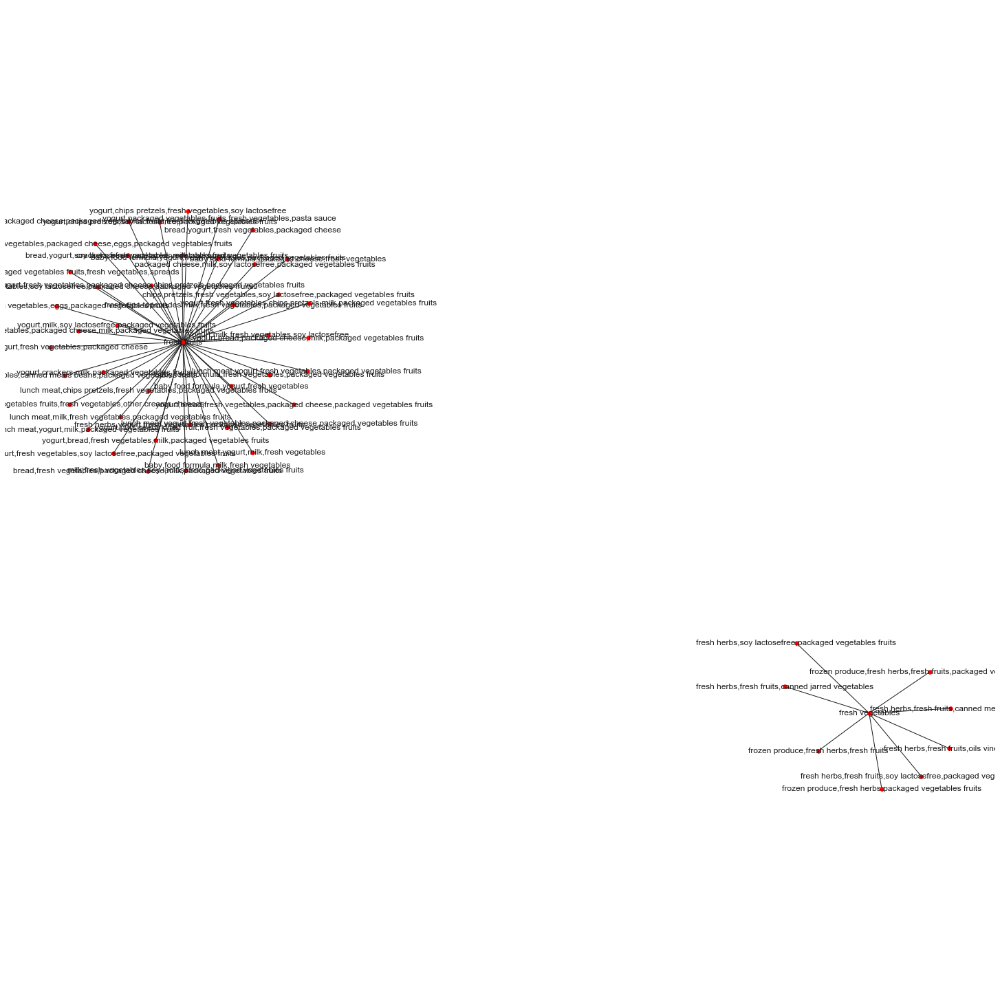

In [99]:
### Plot a basic network graph of the top 50 confidence rules
# Create a copy of the rules and transform the frozensets to strings
rulesToPlot = rulesConfidence.copy(deep=True)
rulesToPlot['LHS'] = [','.join(list(x)) for x in rulesToPlot['antecedents']]
rulesToPlot['RHS'] = [','.join(list(x)) for x in rulesToPlot['consequents']]
# Remove duplicate if reversed rules
rulesToPlot['sortedRow'] = [sorted([a,b]) for a,b in zip(rulesToPlot.LHS, rulesToPlot.RHS)]
rulesToPlot['sortedRow'] = rulesToPlot['sortedRow'].astype(str)
rulesToPlot.drop_duplicates(subset=['sortedRow'], inplace=True)
# Plot
rulesToPlot=rulesToPlot[:50]
fig = plt.figure(figsize=(20, 20)) 
G = nx.from_pandas_edgelist(rulesToPlot, 'LHS', 'RHS')  
# Each node is an itemset (either source or target) and the edges connect the itemsets if they consist of a high confidence rule
nx.draw(G, with_labels=True, node_size=30, node_color="red", pos=nx.spring_layout(G))
plt.axis('equal')
plt.show()
#fig.savefig('figure.svg')
# TRY TO PLOT THE DIRECTION OF SOURCE -> TARGET

## Now, we'll look to find rules in each cluster based on the lvl of support

To do for each cluster

We know, from our previous analysis, that there are no support values above 0.50.

We will check for best top 10 association in each bracket (as in, the top 10 with the highest confidence): 

0.01 support to 0.05 -> ultra rare instances

0.05 to 0.10 -> very rare instances

0.10 to 0.3 -> rare

0.3 to 0.49; -> uncommon

Likewise, we will also monitor the lift variable on each bracket -> this will serve to look for complementary products and substitutes.

At the end of the section, we will look where the commonalities are and where the most significant differences between clusters are.

# Occasional Buyers 

## Uncommon -> min support = 0.3

In [100]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
comp_ord = cluster_0[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

uncommon = apriori(pt, min_support=0.3, use_colnames=True)
# Add a column with the length
#uncommon['length'] = uncommon['itemsets'].apply(lambda x: len(x))
uncommon.head(10)

,support,itemsets
0,0.416805,(fresh fruits)
1,0.309213,(fresh vegetables)


In [101]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(uncommon, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [102]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
complementary = pd.DataFrame()
complementary['Occ_Uncommon_Rule'], complementary['Occ_Uncommon_Conf'], complementary['Occ_Uncommon_Lift'] = comp_placeholder['rule'], comp_placeholder['confidence'], comp_placeholder['lift']
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift


In [103]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#Join on table which we will call substitutes
substitutes = pd.DataFrame()
substitutes['Occ_Uncommon_Rule'], substitutes['Occ_Uncommon_Conf'], substitutes['Occ_Uncommon_Lift'] = sub_placeholder['rule'], sub_placeholder['confidence'], sub_placeholder['lift']
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift


## Rare -> min support = 0.10

As there are no rules with support above 0.1

In [104]:
rare = apriori(pt, min_support=0.1, use_colnames=True)
rare = rare.sort_values(by = 'support', ascending = False)
rare['length'] = rare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
rare[rare['support'] <= 0.3]

,support,itemsets,length
6,0.258825,(packaged vegetables fruits),1
10,0.201197,"(fresh fruits, fresh vegetables)",2
11,0.176037,"(fresh fruits, packaged vegetables fruits)",2
4,0.173002,(milk),1
8,0.172425,(water seltzer sparkling water),1
9,0.170493,(yogurt),1
5,0.149808,(packaged cheese),1
13,0.147723,"(fresh vegetables, packaged vegetables fruits)",2
1,0.122156,(chips pretzels),1
7,0.112560,(soy lactosefree),1


In [105]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(rare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
8,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.147723,0.416805,0.110729,0.749570,1.798369,0.049157,2.328770,"frozenset({'fresh vegetables', 'packaged veget..."
3,(packaged vegetables fruits),(fresh fruits),0.258825,0.416805,0.176037,0.680139,1.631791,0.068157,1.823275,frozenset({'packaged vegetables fruits'})-->fr...
1,(fresh vegetables),(fresh fruits),0.309213,0.416805,0.201197,0.650674,1.561100,0.072315,1.669488,frozenset({'fresh vegetables'})-->frozenset({'...
7,"(fresh fruits, packaged vegetables fruits)",(fresh vegetables),0.176037,0.309213,0.110729,0.629009,2.034226,0.056296,1.862005,"frozenset({'fresh fruits', 'packaged vegetable..."
12,(yogurt),(fresh fruits),0.170493,0.416805,0.104981,0.615752,1.477313,0.033919,1.517756,frozenset({'yogurt'})-->frozenset({'fresh frui...
5,(packaged vegetables fruits),(fresh vegetables),0.258825,0.309213,0.147723,0.570745,1.845800,0.067691,1.609271,frozenset({'packaged vegetables fruits'})-->fr...
6,"(fresh fruits, fresh vegetables)",(packaged vegetables fruits),0.201197,0.258825,0.110729,0.550350,2.126341,0.058654,1.648337,"frozenset({'fresh fruits', 'fresh vegetables'}..."
0,(fresh fruits),(fresh vegetables),0.416805,0.309213,0.201197,0.482712,1.561100,0.072315,1.335402,frozenset({'fresh fruits'})-->frozenset({'fres...
4,(fresh vegetables),(packaged vegetables fruits),0.309213,0.258825,0.147723,0.477739,1.845800,0.067691,1.419166,frozenset({'fresh vegetables'})-->frozenset({'...
11,(packaged vegetables fruits),"(fresh fruits, fresh vegetables)",0.258825,0.201197,0.110729,0.427813,2.126341,0.058654,1.396053,frozenset({'packaged vegetables fruits'})-->fr...


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [106]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Occ_Rare_Conf', 'lift': 'Occ_Rare_Lift', 'rule' : 'Occ_Rare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift
8,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.749570,1.798369
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341


In [107]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Occ_Rare_Conf', 'lift': 'Occ_Rare_Lift', 'rule' : 'Occ_Rare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift


## VeryRare -> min support = 0.05

In [108]:
vrare = apriori(pt, min_support=0.05, use_colnames=True)
vrare = vrare.sort_values(by = 'support', ascending = False)
vrare['length'] = vrare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
vrare[vrare['support'] <= 0.1]

,support,itemsets,length
26,0.097589,(refrigerated),1
39,0.094876,"(fresh fruits, milk)",2
40,0.087162,"(fresh fruits, packaged cheese)",2
27,0.086772,(soft drinks),1
7,0.085263,(eggs),1
5,0.082635,(crackers),1
16,0.081042,(ice cream ice),1
23,0.078668,(packaged produce),1
50,0.078600,"(yogurt, fresh vegetables)",2
14,0.078600,(frozen produce),1


In [109]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(vrare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
45,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.069818,0.416805,0.055746,0.798446,1.915633,0.026645,2.893490,"frozenset({'yogurt', 'packaged vegetables frui..."
37,"(yogurt, fresh vegetables)",(fresh fruits),0.078600,0.416805,0.061748,0.785591,1.884792,0.028987,2.720012,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
60,"(milk, fresh vegetables)",(fresh fruits),0.069055,0.416805,0.052287,0.757181,1.816632,0.023505,2.401772,"frozenset({'milk', 'fresh vegetables'})-->froz..."
8,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.147723,0.416805,0.110729,0.749570,1.798369,0.049157,2.328770,"frozenset({'fresh vegetables', 'packaged veget..."
52,"(packaged cheese, fresh vegetables)",(fresh fruits),0.076159,0.416805,0.055508,0.728851,1.748662,0.023765,2.150830,"frozenset({'packaged cheese', 'fresh vegetable..."
...,...,...,...,...,...,...,...,...,...,...
53,(fresh fruits),"(packaged cheese, fresh vegetables)",0.416805,0.076159,0.055508,0.133176,1.748662,0.023765,1.065777,frozenset({'fresh fruits'})-->frozenset({'pack...
61,(fresh fruits),"(milk, fresh vegetables)",0.416805,0.069055,0.052287,0.125447,1.816632,0.023505,1.064482,frozenset({'fresh fruits'})-->frozenset({'milk...
64,(fresh fruits),(eggs),0.416805,0.085263,0.051677,0.123983,1.454120,0.016139,1.044200,frozenset({'fresh fruits'})-->frozenset({'eggs'})
69,(fresh fruits),(refrigerated),0.416805,0.097589,0.051219,0.122885,1.259206,0.010543,1.028840,frozenset({'fresh fruits'})-->frozenset({'refr...


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [110]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Occ_VRare_Conf', 'lift': 'Occ_VRare_Lift', 'rule' : 'Occ_VRare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226
8,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.749570,1.798369,"frozenset({'fresh vegetables', 'packaged veget...",0.749570,1.798369
20,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged cheese'})-->frozenset({'f...,0.508375,1.644093
36,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.588178,1.902179
37,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'fresh vegetables'})-->fr...",0.785591,1.884792
44,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.531008,2.051611


In [111]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Occ_VRare_Conf', 'lift': 'Occ_VRare_Lift', 'rule' : 'Occ_VRare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614


## UltraRare -> min support = 0.01

In [112]:
urare = apriori(pt, min_support=0.01, use_colnames=True)
urare = urare.sort_values(by = 'support', ascending = False)
urare['length'] = urare['itemsets'].apply(lambda x: len(x))

#just to show relationships at designated interval
urare[urare['support'] <= 0.05]

,support,itemsets,length
9,0.049761,(butter),1
58,0.049405,(oils vinegars),1
734,0.048710,"(fresh fruits, packaged cheese, packaged veget...",3
367,0.048405,"(water seltzer sparkling water, fresh vegetables)",2
20,0.048286,(cookies cakes),1
...,...,...,...
905,0.010003,"(refrigerated, fresh fruits, fresh vegetables,...",4
727,0.010003,"(fresh fruits, packaged cheese, nuts seeds dri...",3
209,0.010003,"(yogurt, coffee)",2
791,0.010003,"(packaged cheese, fresh vegetables, pasta sauce)",3


In [113]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(urare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
3198,"(fresh herbs, fresh fruits, yogurt)",(fresh vegetables),0.012614,0.309213,0.011410,0.904570,2.925394,0.007510,7.238670,"frozenset({'fresh herbs', 'fresh fruits', 'yog..."
747,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.023940,0.309213,0.021600,0.902266,2.917944,0.014197,7.068053,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
3705,"(yogurt, fresh vegetables, soy lactosefree, pa...",(fresh fruits),0.012021,0.416805,0.010766,0.895628,2.148792,0.005756,5.587637,"frozenset({'yogurt', 'fresh vegetables', 'soy ..."
3961,"(fresh herbs, fresh fruits, packaged cheese)",(fresh vegetables),0.011732,0.309213,0.010461,0.891618,2.883509,0.006833,6.373662,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
3475,"(bread, yogurt, fresh vegetables, packaged veg...",(fresh fruits),0.012444,0.416805,0.011003,0.884196,2.121366,0.005816,5.036059,"frozenset({'bread', 'yogurt', 'fresh vegetable..."
...,...,...,...,...,...,...,...,...,...,...
4463,(fresh fruits),"(crackers, soy lactosefree)",0.416805,0.013920,0.010020,0.024040,1.727075,0.004218,1.010370,frozenset({'fresh fruits'})-->frozenset({'crac...
4457,(fresh fruits),"(bread, packaged cheese, fresh vegetables, pac...",0.416805,0.011919,0.010020,0.024040,2.016968,0.005052,1.012420,frozenset({'fresh fruits'})-->frozenset({'brea...
4491,(fresh fruits),"(packaged cheese, nuts seeds dried fruit)",0.416805,0.014106,0.010003,0.023999,1.701358,0.004124,1.010137,frozenset({'fresh fruits'})-->frozenset({'pack...
4485,(fresh fruits),"(refrigerated, packaged cheese, fresh vegetables)",0.416805,0.012716,0.010003,0.023999,1.887373,0.004703,1.011561,frozenset({'fresh fruits'})-->frozenset({'refr...


### Mine complementary products and substitute Products: 

We will consider, for the last section an higher value of confidence h a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [114]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.7) & (rulesConfidence['lift'] >= 1.7)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Occ_URare_Conf', 'lift': 'Occ_URare_Lift', 'rule' : 'Occ_URare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary.sort_values(by = 'Occ_URare_Conf', ascending = False, inplace = True)
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift
3198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'yog...",0.904570,2.925394
747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.902266,2.917944
3705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'fresh vegetables', 'soy ...",0.895628,2.148792
3961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.891618,2.883509
3475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'yogurt', 'fresh vegetable...",0.884196,2.121366
...,...,...,...,...,...,...,...,...,...,...,...,...
36,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.588178,1.902179,NaN,NaN,NaN
44,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.531008,2.051611,NaN,NaN,NaN
51,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged cheese'})...",0.636841,2.059555,NaN,NaN,NaN
58,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'milk'})-->frozense...",0.551108,1.782292,NaN,NaN,NaN


In [115]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Occ_URare_Conf', 'lift': 'Occ_URare_Lift', 'rule' : 'Occ_URare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes.sort_values(by = 'Occ_URare_Lift', ascending = True, inplace = True)
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift
3441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054774,0.631236
3444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.127003,0.631236
1266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.196170,0.634418
1267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.055050,0.634418
1607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.059675,0.687721
1606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'packa...,0.177999,0.687721
432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'soft...,0.063130,0.727543
433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.303243,0.727543
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,0.131681,0.761154
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,0.059878,0.761154


On Occasional buyers, we found 6 relationships up to the UltraRare portions with complementary items and 2 relationships with the substitute-esque relationships.

# Monday Purchasers
We will repeat the same process as with the previous cluster.

## Uncommon

In [116]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
comp_ord = cluster_1[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

uncommon = apriori(pt, min_support=0.3, use_colnames=True)
# Add a column with the length
#uncommon['length'] = uncommon['itemsets'].apply(lambda x: len(x))
uncommon.head(10)

,support,itemsets
0,0.626414,(fresh fruits)
1,0.469723,(fresh vegetables)
2,0.403175,(packaged vegetables fruits)
3,0.311844,(yogurt)
4,0.346076,"(fresh fruits, fresh vegetables)"
5,0.306417,"(fresh fruits, packaged vegetables fruits)"


In [117]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(uncommon, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
3,(packaged vegetables fruits),(fresh fruits),0.403175,0.626414,0.306417,0.760011,1.213272,0.053863,1.556678,frozenset({'packaged vegetables fruits'})-->fr...
1,(fresh vegetables),(fresh fruits),0.469723,0.626414,0.346076,0.736766,1.176165,0.051835,1.419219,frozenset({'fresh vegetables'})-->frozenset({'...
0,(fresh fruits),(fresh vegetables),0.626414,0.469723,0.346076,0.552472,1.176165,0.051835,1.184902,frozenset({'fresh fruits'})-->frozenset({'fres...
2,(fresh fruits),(packaged vegetables fruits),0.626414,0.403175,0.306417,0.489161,1.213272,0.053863,1.168323,frozenset({'fresh fruits'})-->frozenset({'pack...


### Keep finding complementary and substitute relationships

In [118]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Mon_Uncommon_Conf', 'lift': 'Mon_Uncommon_Lift', 'rule' : 'Mon_Uncommon_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift
3198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'yog...",0.904570,2.925394,NaN,NaN,NaN
747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.902266,2.917944,NaN,NaN,NaN
3705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'fresh vegetables', 'soy ...",0.895628,2.148792,NaN,NaN,NaN
3961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.891618,2.883509,NaN,NaN,NaN
3475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'yogurt', 'fresh vegetable...",0.884196,2.121366,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.588178,1.902179,NaN,NaN,NaN,NaN,NaN,NaN
44,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'yogurt'})-->frozen...",0.531008,2.051611,NaN,NaN,NaN,NaN,NaN,NaN
51,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged cheese'})...",0.636841,2.059555,NaN,NaN,NaN,NaN,NaN,NaN
58,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'milk'})-->frozense...",0.551108,1.782292,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Mon_Uncommon_Conf', 'lift': 'Mon_Uncommon_Lift', 'rule' : 'Mon_Uncommon_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift
3441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054774,0.631236,NaN,NaN,NaN
3444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.127003,0.631236,NaN,NaN,NaN
1266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.196170,0.634418,NaN,NaN,NaN
1267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.055050,0.634418,NaN,NaN,NaN
1607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.059675,0.687721,NaN,NaN,NaN
1606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'packa...,0.177999,0.687721,NaN,NaN,NaN
432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'soft...,0.063130,0.727543,NaN,NaN,NaN
433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.303243,0.727543,NaN,NaN,NaN
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,0.131681,0.761154,NaN,NaN,NaN
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,0.059878,0.761154,NaN,NaN,NaN


## Rare

In [120]:
rare = apriori(pt, min_support=0.1, use_colnames=True)
rare = rare.sort_values(by = 'support', ascending = False)
rare['length'] = rare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
rare[rare['support'] <= 0.3]

,support,itemsets,length
13,0.280743,(milk),1
14,0.258578,(packaged cheese),1
34,0.255771,"(fresh vegetables, packaged vegetables fruits)",2
31,0.229232,"(yogurt, fresh fruits)",2
44,0.206042,"(fresh fruits, fresh vegetables, packaged vege...",3
18,0.205502,(water seltzer sparkling water),1
25,0.201614,"(fresh fruits, milk)",2
17,0.197754,(soy lactosefree),1
2,0.192948,(chips pretzels),1
0,0.185416,(bread),1


In [121]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(rare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
68,"(milk, packaged vegetables fruits)",(fresh fruits),0.127696,0.626414,0.106261,0.832135,1.328411,0.026270,2.225519,"frozenset({'milk', 'packaged vegetables fruits..."
45,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.152372,0.626414,0.126724,0.831680,1.327684,0.031277,2.219494,"frozenset({'yogurt', 'packaged vegetables frui..."
29,"(yogurt, fresh vegetables)",(fresh fruits),0.166059,0.626414,0.136011,0.819054,1.307528,0.031990,2.064625,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
60,"(milk, fresh vegetables)",(fresh fruits),0.141006,0.626414,0.114900,0.814857,1.300829,0.026572,2.017828,"frozenset({'milk', 'fresh vegetables'})-->froz..."
10,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.255771,0.626414,0.206042,0.805573,1.286008,0.045824,1.921473,"frozenset({'fresh vegetables', 'packaged veget..."
78,"(packaged cheese, packaged vegetables fruits)",(fresh fruits),0.130369,0.626414,0.104776,0.803686,1.282995,0.023111,1.903003,"frozenset({'packaged cheese', 'packaged vegeta..."
52,"(packaged cheese, fresh vegetables)",(fresh fruits),0.149969,0.626414,0.118220,0.788299,1.258431,0.024278,1.764686,"frozenset({'packaged cheese', 'fresh vegetable..."
3,(packaged vegetables fruits),(fresh fruits),0.403175,0.626414,0.306417,0.760011,1.213272,0.053863,1.556678,frozenset({'packaged vegetables fruits'})-->fr...
1,(fresh vegetables),(fresh fruits),0.469723,0.626414,0.346076,0.736766,1.176165,0.051835,1.419219,frozenset({'fresh vegetables'})-->frozenset({'...
25,(soy lactosefree),(fresh fruits),0.197754,0.626414,0.145379,0.735154,1.173591,0.021504,1.410576,frozenset({'soy lactosefree'})-->frozenset({'f...


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [122]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Mon_Rare_Conf', 'lift': 'Mon_Rare_Lift', 'rule' : 'Mon_Rare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'fresh fruits', 'packaged ...",0.736908,2.383172,NaN,NaN,NaN,NaN,NaN,NaN
4462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'crackers', 'soy lactosefree'})-->f...",0.719854,1.727075,NaN,NaN,NaN,NaN,NaN,NaN
4467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'frozen breakfast'})-->fr...",0.741206,1.778304,NaN,NaN,NaN,NaN,NaN,NaN
4476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'refrigerated', 'packaged cheese', ...",0.786667,1.887373,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Mon_Rare_Conf', 'lift': 'Mon_Rare_Lift', 'rule' : 'Mon_Rare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,Occ_URare_Conf,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift
3441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054774,0.631236,NaN,NaN,NaN,NaN,NaN,NaN
3444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.127003,0.631236,NaN,NaN,NaN,NaN,NaN,NaN
1266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.196170,0.634418,NaN,NaN,NaN,NaN,NaN,NaN
1267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.055050,0.634418,NaN,NaN,NaN,NaN,NaN,NaN
1607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.059675,0.687721,NaN,NaN,NaN,NaN,NaN,NaN
1606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'packa...,0.177999,0.687721,NaN,NaN,NaN,NaN,NaN,NaN
432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'soft...,0.063130,0.727543,NaN,NaN,NaN,NaN,NaN,NaN
433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.303243,0.727543,NaN,NaN,NaN,NaN,NaN,NaN
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,0.131681,0.761154,NaN,NaN,NaN,NaN,NaN,NaN
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,0.059878,0.761154,NaN,NaN,NaN,NaN,NaN,NaN


## VeryRare -> min support = 0.05

In [124]:
vrare = apriori(pt, min_support=0.05, use_colnames=True)
vrare = vrare.sort_values(by = 'support', ascending = False)
vrare['length'] = vrare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
vrare[vrare['support'] <= 0.1]

,support,itemsets,length
94,0.098000,"(frozen produce, fresh fruits)",2
139,0.097865,"(soy lactosefree, packaged vegetables fruits)",2
34,0.096002,(nuts seeds dried fruit),1
31,0.095975,(juice nectars),1
36,0.095516,(other creams cheeses),1
...,...,...,...
173,0.050998,"(lunch meat, fresh fruits, packaged vegetables...",3
27,0.050917,(hot cereal pancake mixes),1
72,0.050620,"(water seltzer sparkling water, chips pretzels)",2
114,0.050593,"(ice cream ice, fresh vegetables)",2


In [125]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(vrare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
312,"(fresh herbs, fresh fruits)",(fresh vegetables),0.073000,0.469723,0.063956,0.876109,1.865163,0.029666,4.280208,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
490,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.061715,0.626414,0.053886,0.873141,1.393872,0.015227,2.944888,"frozenset({'yogurt', 'milk', 'packaged vegetab..."
213,"(milk, fresh vegetables, packaged vegetables f...",(fresh fruits),0.084069,0.626414,0.073216,0.870906,1.390304,0.020554,2.893898,"frozenset({'milk', 'fresh vegetables', 'packag..."
122,"(yogurt, fresh vegetables, packaged vegetables...",(fresh fruits),0.100942,0.626414,0.087606,0.867879,1.385472,0.024374,2.827608,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
528,"(yogurt, packaged cheese, packaged vegetables ...",(fresh fruits),0.060717,0.626414,0.052617,0.866607,1.383442,0.014584,2.800650,"frozenset({'yogurt', 'packaged cheese', 'packa..."
...,...,...,...,...,...,...,...,...,...,...
571,(fresh fruits),"(bread, fresh vegetables, packaged vegetables ...",0.626414,0.060663,0.052131,0.083222,1.371885,0.014132,1.024607,frozenset({'fresh fruits'})-->frozenset({'brea...
578,(fresh fruits),"(fresh dips tapenades, fresh vegetables)",0.626414,0.062903,0.052023,0.083050,1.320275,0.012620,1.021971,frozenset({'fresh fruits'})-->frozenset({'fres...
584,(fresh fruits),"(fresh dips tapenades, packaged vegetables fru...",0.626414,0.062903,0.051753,0.082619,1.313423,0.012350,1.021491,frozenset({'fresh fruits'})-->frozenset({'fres...
591,(fresh fruits),"(crackers, packaged vegetables fruits)",0.626414,0.063524,0.051537,0.082274,1.295157,0.011745,1.020431,frozenset({'fresh fruits'})-->frozenset({'crac...


### Mine complementary products and substitute Products: 

In [126]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Mon_VRare_Conf', 'lift': 'Mon_VRare_Lift', 'rule' : 'Mon_VRare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'fresh fruits', 'packaged ...",...,2.383172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'crackers', 'soy lactosefree'})-->f...",...,1.727075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'frozen breakfast'})-->fr...",...,1.778304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'refrigerated', 'packaged cheese', ...",...,1.887373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [127]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Mon_VRare_Conf', 'lift': 'Mon_VRare_Lift', 'rule' : 'Mon_VRare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Occ_URare_Lift,Mon_Uncommon_Rule,Mon_Uncommon_Conf,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614,frozenset({'water seltzer sparkling water'})--...,...,0.956614,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614,frozenset({'fresh fruits'})-->frozenset({'wate...,...,0.956614,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,...,0.907878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,...,0.907878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.441671,0.94028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,0.895782,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,...,0.761154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,0.761154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'popcorn jerky'})-->frozenset({'fre...,...,0.864438,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## UltraRare -> min support = 0.01

In [128]:
urare = apriori(pt, min_support=0.01, use_colnames=True)
urare = urare.sort_values(by = 'support', ascending = False)
urare['length'] = urare['itemsets'].apply(lambda x: len(x))

#just to show relationships at designated interval
urare[urare['support'] <= 0.05]

,support,itemsets,length
2221,0.049837,"(fresh herbs, fresh vegetables, packaged veget...",3
544,0.049648,"(packaged cheese, eggs)",2
232,0.049567,"(fresh vegetables, butter)",2
479,0.049567,"(cream, fresh vegetables)",2
640,0.049513,"(fresh fruits, pasta sauce)",2
...,...,...,...
2845,0.010016,"(cereal, fresh vegetables, soy lactosefree, pa...",4
3242,0.010016,"(spices seasonings, fresh fruits, fresh vegeta...",4
548,0.010016,"(poultry counter, eggs)",2
1264,0.010016,"(yogurt, chips pretzels, breakfast bakery)",3


In [129]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(urare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
25663,"(yogurt, fresh vegetables, milk, eggs, package...",(fresh fruits),0.011474,0.626414,0.010988,0.957647,1.528777,0.003800,8.820781,"frozenset({'yogurt', 'fresh vegetables', 'milk..."
15475,"(fresh herbs, fresh fruits, canned jarred vege...",(fresh vegetables),0.014335,0.469723,0.013526,0.943503,2.008638,0.006792,9.385908,"frozenset({'fresh herbs', 'fresh fruits', 'can..."
31599,"(fruit vegetable snacks, milk, packaged vegeta...",(fresh fruits),0.010664,0.626414,0.010043,0.941772,1.503434,0.003363,6.415934,"frozenset({'fruit vegetable snacks', 'milk', '..."
24937,"(fresh herbs, fresh fruits, canned meals beans)",(fresh vegetables),0.011825,0.469723,0.011123,0.940639,2.002541,0.005568,8.933132,"frozenset({'fresh herbs', 'fresh fruits', 'can..."
26715,"(yogurt, fresh vegetables, packaged cheese, eg...",(fresh fruits),0.011528,0.626414,0.010799,0.936768,1.495446,0.003578,5.908194,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
...,...,...,...,...,...,...,...,...,...,...
32036,(fresh fruits),"(fresh dips tapenades, breakfast bakery)",0.626414,0.012365,0.010016,0.015989,1.293144,0.002271,1.003684,frozenset({'fresh fruits'})-->frozenset({'fres...
32008,(fresh fruits),"(packaged cheese, milk, pasta sauce)",0.626414,0.011825,0.010016,0.015989,1.352192,0.002609,1.004232,frozenset({'fresh fruits'})-->frozenset({'pack...
32079,(fresh fruits),"(spices seasonings, packaged cheese, fresh veg...",0.626414,0.013040,0.010016,0.015989,1.226211,0.001848,1.002998,frozenset({'fresh fruits'})-->frozenset({'spic...
32117,(fresh fruits),"(packaged cheese, packaged vegetables fruits, ...",0.626414,0.011339,0.010016,0.015989,1.410143,0.002913,1.004726,frozenset({'fresh fruits'})-->frozenset({'pack...


### Mine complementary products and substitute Products: 

In [130]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.7) & (rulesConfidence['lift'] >= 1.70)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Mon_URare_Conf', 'lift': 'Mon_URare_Lift', 'rule' : 'Mon_URare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary.sort_values(by = 'Mon_URare_Conf', ascending = False, inplace = True)
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift
15475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.943503,2.008638
24937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.940639,2.002541
28699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'packaged vegetables...",0.932530,1.985278
31533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.930175,1.980263
26221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'sou...",0.926437,1.972306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'fresh fruits', 'packaged ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'crackers', 'soy lactosefree'})-->f...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'frozen breakfast'})-->fr...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'refrigerated', 'packaged cheese', ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [131]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Mon_URare_Conf', 'lift': 'Mon_URare_Lift', 'rule' : 'Mon_URare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes.sort_values(by = 'Mon_URare_Lift', ascending = True, inplace = True)
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_Uncommon_Lift,Mon_Rare_Rule,Mon_Rare_Conf,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift
27944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.051232,0.592652
27953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.122111,0.592652
16359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.152092,0.594644
16358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.051404,0.594644
6802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.219863,0.635302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'popcorn jerky'})-->frozenset({'fre...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Sunday Purchasers 

# Sunday Purchasers

## Uncommon

In [132]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
comp_ord = cluster_2[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

uncommon = apriori(pt, min_support=0.3, use_colnames=True)
# Add a column with the length
#uncommon['length'] = uncommon['itemsets'].apply(lambda x: len(x))
uncommon.head(10)

,support,itemsets
0,0.635189,(fresh fruits)
1,0.549892,(fresh vegetables)
2,0.443432,(packaged vegetables fruits)
3,0.314676,(yogurt)
4,0.409622,"(fresh fruits, fresh vegetables)"
5,0.338243,"(fresh fruits, packaged vegetables fruits)"
6,0.305486,"(fresh vegetables, packaged vegetables fruits)"


In [133]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(uncommon, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
3,(packaged vegetables fruits),(fresh fruits),0.443432,0.635189,0.338243,0.762784,1.200877,0.056580,1.537886,frozenset({'packaged vegetables fruits'})-->fr...
1,(fresh vegetables),(fresh fruits),0.549892,0.635189,0.409622,0.744913,1.172742,0.060336,1.430143,frozenset({'fresh vegetables'})-->frozenset({'...
5,(packaged vegetables fruits),(fresh vegetables),0.443432,0.549892,0.305486,0.688913,1.252816,0.061647,1.446889,frozenset({'packaged vegetables fruits'})-->fr...
0,(fresh fruits),(fresh vegetables),0.635189,0.549892,0.409622,0.644881,1.172742,0.060336,1.267486,frozenset({'fresh fruits'})-->frozenset({'fres...
4,(fresh vegetables),(packaged vegetables fruits),0.549892,0.443432,0.305486,0.555539,1.252816,0.061647,1.252231,frozenset({'fresh vegetables'})-->frozenset({'...
2,(fresh fruits),(packaged vegetables fruits),0.635189,0.443432,0.338243,0.532508,1.200877,0.056580,1.190539,frozenset({'fresh fruits'})-->frozenset({'pack...


### Complementary products and substitute Products: 

In [134]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sun_Uncommon_Conf', 'lift': 'Sun_Uncommon_Lift', 'rule' : 'Sun_Uncommon_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift
15475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.943503,2.008638,NaN,NaN,NaN
24937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.940639,2.002541,NaN,NaN,NaN
28699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'packaged vegetables...",0.932530,1.985278,NaN,NaN,NaN
31533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.930175,1.980263,NaN,NaN,NaN
26221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'sou...",0.926437,1.972306,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'bread', 'fresh fruits', 'packaged ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'crackers', 'soy lactosefree'})-->f...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'yogurt', 'frozen breakfast'})-->fr...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'refrigerated', 'packaged cheese', ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [135]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#Join on table which we will call substitutes

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sun_Uncommon_Conf', 'lift': 'Sun_Uncommon_Lift', 'rule' : 'Sun_Uncommon_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift
27944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.051232,0.592652,NaN,NaN,NaN
27953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.122111,0.592652,NaN,NaN,NaN
16359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.152092,0.594644,NaN,NaN,NaN
16358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.051404,0.594644,NaN,NaN,NaN
6802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.219863,0.635302,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'milk'})-->frozenset({'packaged pro...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'packaged produce'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'popcorn jerky'})-->frozenset({'fre...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Rare

In [136]:
rare = apriori(pt, min_support=0.1, use_colnames=True)
rare = rare.sort_values(by = 'support', ascending = False)
rare['length'] = rare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
rare[rare['support'] <= 0.3]

,support,itemsets,length
16,0.283027,(packaged cheese),1
14,0.277405,(milk),1
56,0.248838,"(fresh fruits, fresh vegetables, packaged vege...",3
38,0.239054,"(yogurt, fresh fruits)",2
33,0.201135,"(fresh fruits, packaged cheese)",2
32,0.200865,"(fresh fruits, milk)",2
21,0.200459,(water seltzer sparkling water),1
0,0.197027,(bread),1
46,0.194432,"(yogurt, fresh vegetables)",2
20,0.194324,(soy lactosefree),1


In [137]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(rare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
106,"(yogurt, fresh vegetables, packaged vegetables...",(fresh fruits),0.122486,0.635189,0.107568,0.878199,1.382579,0.029765,2.995150,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
124,(fresh herbs),(fresh vegetables),0.117838,0.549892,0.102486,0.869725,1.581629,0.037688,3.455055,frozenset({'fresh herbs'})-->frozenset({'fresh...
43,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.169081,0.635189,0.142459,0.842551,1.326457,0.035061,2.317012,"frozenset({'yogurt', 'packaged vegetables frui..."
25,"(yogurt, fresh vegetables)",(fresh fruits),0.194432,0.635189,0.163622,0.841535,1.324857,0.040120,2.302148,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
90,"(milk, packaged vegetables fruits)",(fresh fruits),0.138838,0.635189,0.114568,0.825190,1.299124,0.026379,2.086897,"frozenset({'milk', 'packaged vegetables fruits..."
128,"(fresh vegetables, soy lactosefree)",(fresh fruits),0.123324,0.635189,0.101000,0.818979,1.289346,0.022666,2.015293,"frozenset({'fresh vegetables', 'soy lactosefre..."
54,"(milk, fresh vegetables)",(fresh fruits),0.163027,0.635189,0.133514,0.818966,1.289325,0.029961,2.015145,"frozenset({'milk', 'fresh vegetables'})-->froz..."
8,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.305486,0.635189,0.248838,0.814563,1.282394,0.054796,1.967298,"frozenset({'fresh vegetables', 'packaged veget..."
74,"(packaged cheese, packaged vegetables fruits)",(fresh fruits),0.150811,0.635189,0.121541,0.805914,1.268778,0.025747,1.879635,"frozenset({'packaged cheese', 'packaged vegeta..."
36,"(packaged cheese, fresh vegetables)",(fresh fruits),0.184243,0.635189,0.144919,0.786563,1.238313,0.027890,1.709220,"frozenset({'packaged cheese', 'fresh vegetable..."


### Mine complementary products and substitute Products: 

In [138]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sun_Rare_Conf', 'lift': 'Sun_Rare_Lift', 'rule' : 'Sun_Rare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'yogurt', 'milk', 'fresh vegetables...",0.745491,1.849051,NaN,NaN,NaN,NaN,NaN,NaN
31836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'yogurt', 'bread', 'fresh fruits', ...",0.710728,1.762828,NaN,NaN,NaN,NaN,NaN,NaN
31993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'dry pasta', 'canned jarred vegetab...",0.813596,1.732078,NaN,NaN,NaN,NaN,NaN,NaN
32040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'yogurt', 'instant foods', 'fresh v...",0.717602,1.779877,NaN,NaN,NaN,NaN,NaN,NaN


In [139]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sun_Rare_Conf', 'lift': 'Sun_Rare_Lift', 'rule' : 'Sun_Rare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_VRare_Lift,Mon_URare_Rule,Mon_URare_Conf,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614,frozenset({'fresh fruits'})-->frozenset({'wate...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.542268,0.986135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'water seltzer sparkling water'})--...,0.048739,0.983298,NaN,NaN,NaN,NaN,NaN,NaN
32012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'refrigerated', 'energy granola bar...",0.452439,0.963204,NaN,NaN,NaN,NaN,NaN,NaN
32017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.021323,0.963204,NaN,NaN,NaN,NaN,NaN,NaN
32024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'bread'})-->frozenset({'packaged pr...,0.054019,0.875286,NaN,NaN,NaN,NaN,NaN,NaN


## VeryRare -> min support = 0.05

In [140]:
vrare = apriori(pt, min_support=0.05, use_colnames=True)
vrare = vrare.sort_values(by = 'support', ascending = False)
vrare['length'] = vrare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
vrare[vrare['support'] <= 0.1]

,support,itemsets,length
229,0.099297,"(milk, fresh vegetables, packaged vegetables f...",3
172,0.098108,"(bread, fresh fruits, fresh vegetables)",3
7,0.097378,(canned jarred vegetables),1
216,0.097324,"(yogurt, fresh fruits, milk)",3
111,0.095730,"(lunch meat, fresh fruits)",2
...,...,...,...
0,0.050703,(asian foods),1
90,0.050405,"(dry pasta, packaged vegetables fruits)",2
57,0.050270,"(bread, eggs)",2
200,0.050270,"(ice cream ice, fresh fruits, fresh vegetables)",3


In [141]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(vrare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
755,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.058054,0.549892,0.053730,0.925512,1.683080,0.021806,6.042701,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
497,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.069027,0.549892,0.062838,0.910337,1.655483,0.024880,5.019983,"frozenset({'fresh herbs', 'packaged vegetables..."
236,"(fresh herbs, fresh fruits)",(fresh vegetables),0.092027,0.549892,0.083000,0.901909,1.640157,0.032395,4.588677,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
382,"(yogurt, milk, fresh vegetables)",(fresh fruits),0.077000,0.635189,0.068405,0.888382,1.398610,0.019496,3.268384,"frozenset({'yogurt', 'milk', 'fresh vegetables..."
530,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.069676,0.635189,0.061351,0.880528,1.386245,0.017094,3.053514,"frozenset({'yogurt', 'milk', 'packaged vegetab..."
...,...,...,...,...,...,...,...,...,...,...
827,(fresh fruits),"(frozen produce, yogurt)",0.635189,0.061811,0.051973,0.081823,1.323762,0.012711,1.021795,frozenset({'fresh fruits'})-->frozenset({'froz...
851,(fresh fruits),"(packaged cheese, chips pretzels)",0.635189,0.068459,0.051595,0.081227,1.186500,0.008110,1.013896,frozenset({'fresh fruits'})-->frozenset({'pack...
859,(fresh fruits),"(dry pasta, fresh vegetables)",0.635189,0.065297,0.051270,0.080717,1.236139,0.009794,1.016773,frozenset({'fresh fruits'})-->frozenset({'dry ...
872,(fresh fruits),"(packaged cheese, milk, packaged vegetables fr...",0.635189,0.059946,0.051189,0.080589,1.344359,0.013112,1.022452,frozenset({'fresh fruits'})-->frozenset({'pack...


In [142]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sun_VRare_Conf', 'lift': 'Sun_VRare_Lift', 'rule' : 'Sun_VRare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.849051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.762828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.732078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.779877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sun_VRare_Conf', 'lift': 'Sun_VRare_Lift', 'rule' : 'Sun_VRare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Mon_URare_Lift,Sun_Uncommon_Rule,Sun_Uncommon_Conf,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614,frozenset({'fresh fruits'})-->frozenset({'wate...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.542268,0.986135,frozenset({'water seltzer sparkling water'})--...,0.542268,0.986135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.983298,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.963204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.963204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.875286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## UltraRare -> min support = 0.01

In [144]:
urare = apriori(pt, min_support=0.01, use_colnames=True)
urare = urare.sort_values(by = 'support', ascending = False)
urare['length'] = urare['itemsets'].apply(lambda x: len(x))

#just to show relationships at designated interval
urare[urare['support'] <= 0.05]

,support,itemsets,length
2147,0.049811,"(fresh fruits, milk, eggs)",3
2364,0.049703,"(fresh fruits, fresh vegetables, hot dogs baco...",3
2239,0.049595,"(fresh fruits, energy granola bars, fresh vege...",3
376,0.049514,"(cereal, packaged vegetables fruits)",2
68,0.049459,(packaged produce),1
...,...,...,...
1476,0.010000,"(water seltzer sparkling water, breakfast bake...",3
2434,0.010000,"(frozen produce, fresh fruits, grains rice dri...",3
1529,0.010000,"(refrigerated, fresh fruits, candy chocolate)",3
1166,0.010000,"(baby food formula, fresh fruits, crackers)",3


In [145]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(urare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
23401,"(fresh herbs, fresh fruits, eggs, packaged veg...",(fresh vegetables),0.014135,0.549892,0.013676,0.967495,1.759428,0.005903,13.847444,"frozenset({'fresh herbs', 'fresh fruits', 'egg..."
26845,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.013324,0.549892,0.012865,0.965517,1.755831,0.005538,13.053135,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
17674,"(fresh herbs, eggs, packaged vegetables fruits)",(fresh vegetables),0.015865,0.549892,0.015189,0.957411,1.741089,0.006465,10.568538,"frozenset({'fresh herbs', 'eggs', 'packaged ve..."
39195,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.011405,0.549892,0.010919,0.957346,1.740971,0.004647,10.552535,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
41606,"(yogurt, fresh vegetables, fruit vegetable sna...",(fresh fruits),0.011162,0.635189,0.010676,0.956416,1.505719,0.003586,8.370381,"frozenset({'yogurt', 'fresh vegetables', 'frui..."
...,...,...,...,...,...,...,...,...,...,...
48158,(fresh fruits),"(fresh vegetables, canned meals beans, other c...",0.635189,0.012189,0.010000,0.015743,1.291582,0.002258,1.003611,frozenset({'fresh fruits'})-->frozenset({'fres...
48145,(fresh fruits),"(lunch meat, tortillas flat bread, fresh veget...",0.635189,0.011784,0.010000,0.015743,1.336017,0.002515,1.004023,frozenset({'fresh fruits'})-->frozenset({'lunc...
48123,(fresh fruits),"(energy granola bars, frozen meals)",0.635189,0.013486,0.010000,0.015743,1.167342,0.001434,1.002293,frozenset({'fresh fruits'})-->frozenset({'ener...
48496,(fresh fruits),"(frozen produce, grains rice dried goods)",0.635189,0.012243,0.010000,0.015743,1.285880,0.002223,1.003556,frozenset({'fresh fruits'})-->frozenset({'froz...


### Mine complementary products and substitute Products: 

Again, Different for URare

In [146]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.7) & (rulesConfidence['lift'] >= 1.70)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sun_URare_Conf', 'lift': 'Sun_URare_Lift', 'rule' : 'Sun_URare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary.sort_values(by = 'Sun_URare_Conf', ascending = False, inplace = True)
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift
23401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'egg...",0.967495,1.759428
26845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.965517,1.755831
17674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'eggs', 'packaged ve...",0.957411,1.741089
39195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.957346,1.740971
17843,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'packaged vegetables...",0.955631,1.737853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [147]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sun_URare_Conf', 'lift': 'Sun_URare_Lift', 'rule' : 'Sun_URare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes.sort_values(by = 'Sun_URare_Lift', ascending = True, inplace = True)
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_Uncommon_Lift,Sun_Rare_Rule,Sun_Rare_Conf,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift
25349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.174053,0.699463
25340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.052895,0.699463
6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.296283,0.723309
6859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054698,0.723309
47663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.018284,0.723526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Monday Purchasers
We will repeat the same process as with the previous cluster.

## Uncommon

In [148]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
comp_ord = cluster_3[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

uncommon = apriori(pt, min_support=0.3, use_colnames=True)
# Add a column with the length
#uncommon['length'] = uncommon['itemsets'].apply(lambda x: len(x))
uncommon.head(10)

,support,itemsets
0,0.605281,(fresh fruits)
1,0.529580,(fresh vegetables)
2,0.414378,(packaged vegetables fruits)
3,0.381407,"(fresh fruits, fresh vegetables)"
4,0.309442,"(fresh fruits, packaged vegetables fruits)"


In [149]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(uncommon, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
3,(packaged vegetables fruits),(fresh fruits),0.414378,0.605281,0.309442,0.746761,1.233742,0.058626,1.558682,frozenset({'packaged vegetables fruits'})-->fr...
1,(fresh vegetables),(fresh fruits),0.529580,0.605281,0.381407,0.720205,1.189869,0.060862,1.410745,frozenset({'fresh vegetables'})-->frozenset({'...
0,(fresh fruits),(fresh vegetables),0.605281,0.529580,0.381407,0.630131,1.189869,0.060862,1.271856,frozenset({'fresh fruits'})-->frozenset({'fres...
2,(fresh fruits),(packaged vegetables fruits),0.605281,0.414378,0.309442,0.511236,1.233742,0.058626,1.198169,frozenset({'fresh fruits'})-->frozenset({'pack...


In [150]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sat_Uncommon_Conf', 'lift': 'Sat_Uncommon_Lift', 'rule' : 'Sat_Uncommon_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift
23401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'egg...",0.967495,1.759428,NaN,NaN,NaN
26845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.965517,1.755831,NaN,NaN,NaN
17674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'eggs', 'packaged ve...",0.957411,1.741089,NaN,NaN,NaN
39195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.957346,1.740971,NaN,NaN,NaN
17843,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'packaged vegetables...",0.955631,1.737853,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [151]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sat_Uncommon_Conf', 'lift': 'Sat_Uncommon_Lift', 'rule' : 'Sat_Uncommon_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_Rare_Lift,Sun_VRare_Rule,Sun_VRare_Conf,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift
25349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.174053,0.699463,NaN,NaN,NaN
25340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.052895,0.699463,NaN,NaN,NaN
6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.296283,0.723309,NaN,NaN,NaN
6859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054698,0.723309,NaN,NaN,NaN
47663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.018284,0.723526,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Rare

In [152]:
rare = apriori(pt, min_support=0.1, use_colnames=True)
rare = rare.sort_values(by = 'support', ascending = False)
rare['length'] = rare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
rare[rare['support'] <= 0.3]

,support,itemsets,length
22,0.299068,(yogurt),1
41,0.283724,"(fresh vegetables, packaged vegetables fruits)",2
16,0.271718,(packaged cheese),1
14,0.261743,(milk),1
52,0.226740,"(fresh fruits, fresh vegetables, packaged vege...",3
37,0.219087,"(yogurt, fresh fruits)",2
21,0.195546,(water seltzer sparkling water),1
20,0.194312,(soy lactosefree),1
0,0.190177,(bread),1
2,0.189053,(chips pretzels),1


In [153]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(rare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
98,(fresh herbs),(fresh vegetables),0.119881,0.529580,0.102434,0.854463,1.613472,0.038947,3.232302,frozenset({'fresh herbs'})-->frozenset({'fresh...
45,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.152200,0.605281,0.126084,0.828408,1.368633,0.033960,2.300333,"frozenset({'yogurt', 'packaged vegetables frui..."
27,"(yogurt, fresh vegetables)",(fresh fruits),0.180783,0.605281,0.147267,0.814607,1.345832,0.037842,2.129089,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
102,"(milk, packaged vegetables fruits)",(fresh fruits),0.125721,0.605281,0.102107,0.812175,1.341815,0.026011,2.101528,"frozenset({'milk', 'packaged vegetables fruits..."
8,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.283724,0.605281,0.226740,0.799156,1.320306,0.055007,1.965302,"frozenset({'fresh vegetables', 'packaged veget..."
58,"(milk, fresh vegetables)",(fresh fruits),0.152164,0.605281,0.120353,0.790942,1.306734,0.028251,1.888079,"frozenset({'milk', 'fresh vegetables'})-->froz..."
70,"(packaged cheese, packaged vegetables fruits)",(fresh fruits),0.141318,0.605281,0.111393,0.788244,1.302278,0.025856,1.864029,"frozenset({'packaged cheese', 'packaged vegeta..."
40,"(packaged cheese, fresh vegetables)",(fresh fruits),0.169139,0.605281,0.129348,0.764744,1.263452,0.026971,1.677824,"frozenset({'packaged cheese', 'fresh vegetable..."
3,(packaged vegetables fruits),(fresh fruits),0.414378,0.605281,0.309442,0.746761,1.233742,0.058626,1.558682,frozenset({'packaged vegetables fruits'})-->fr...
89,"(packaged cheese, packaged vegetables fruits)",(fresh vegetables),0.141318,0.529580,0.104030,0.736140,1.390043,0.029191,1.782836,"frozenset({'packaged cheese', 'packaged vegeta..."


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [154]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sat_Rare_Conf', 'lift': 'Sat_Rare_Lift', 'rule' : 'Sat_Rare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'yogurt', 'tortillas flat bread', '...",0.704120,1.718952,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh herbs', 'baking ingredients'...",0.722543,1.763929,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'spices seasonings', 'fresh herbs',...",0.941919,1.712917,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'packaged vegetables fruits', 'eggs...",0.737154,1.799598,NaN,NaN,NaN,NaN,NaN,NaN


In [155]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sat_Rare_Conf', 'lift': 'Sat_Rare_Lift', 'rule' : 'Sat_Rare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_VRare_Lift,Sun_URare_Rule,Sun_URare_Conf,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift
25349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.174053,0.699463,NaN,NaN,NaN,NaN,NaN,NaN
25340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.052895,0.699463,NaN,NaN,NaN,NaN,NaN,NaN
6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.296283,0.723309,NaN,NaN,NaN,NaN,NaN,NaN
6859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.054698,0.723309,NaN,NaN,NaN,NaN,NaN,NaN
47663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.018284,0.723526,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## VeryRare -> min support = 0.05

In [156]:
vrare = apriori(pt, min_support=0.05, use_colnames=True)
vrare = vrare.sort_values(by = 'support', ascending = False)
vrare['length'] = vrare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
vrare[vrare['support'] <= 0.1]

,support,itemsets,length
150,0.098480,"(soy lactosefree, packaged vegetables fruits)",2
117,0.097972,"(frozen produce, fresh vegetables)",2
186,0.095869,"(fresh fruits, fresh vegetables, soy lactosefree)",3
223,0.094563,"(yogurt, fresh fruits, fresh vegetables, packa...",4
15,0.093184,(cream),1
...,...,...,...
157,0.051036,"(bread, fresh fruits, milk)",3
95,0.050999,"(fresh fruits, frozen breakfast)",2
60,0.050274,"(fresh fruits, breakfast bakery)",2
169,0.050129,"(fresh fruits, crackers, packaged vegetables f...",3


In [157]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(vrare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
681,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.056223,0.529580,0.051507,0.916129,1.729915,0.021733,5.608850,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
419,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.067794,0.529580,0.060974,0.899411,1.698348,0.025072,4.676672,"frozenset({'fresh herbs', 'packaged vegetables..."
204,"(fresh herbs, fresh fruits)",(fresh vegetables),0.091081,0.529580,0.081178,0.891278,1.682990,0.032944,4.326827,"frozenset({'fresh herbs', 'fresh fruits'})-->f..."
594,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.060902,0.605281,0.053248,0.874330,1.444502,0.016386,3.140913,"frozenset({'yogurt', 'milk', 'packaged vegetab..."
534,"(yogurt, packaged cheese, packaged vegetables ...",(fresh fruits),0.064384,0.605281,0.055642,0.864225,1.427808,0.016672,2.907161,"frozenset({'yogurt', 'packaged cheese', 'packa..."
...,...,...,...,...,...,...,...,...,...,...
714,(fresh fruits),"(fresh dips tapenades, packaged vegetables fru...",0.605281,0.063767,0.051144,0.084497,1.325083,0.012547,1.022643,frozenset({'fresh fruits'})-->frozenset({'fres...
720,(fresh fruits),"(bread, milk)",0.605281,0.068047,0.051036,0.084317,1.239093,0.009848,1.017768,frozenset({'fresh fruits'})-->frozenset({'brea...
722,(fresh fruits),(frozen breakfast),0.605281,0.072944,0.050999,0.084257,1.155090,0.006848,1.012354,frozenset({'fresh fruits'})-->frozenset({'froz...
724,(fresh fruits),(breakfast bakery),0.605281,0.073488,0.050274,0.083059,1.130229,0.005793,1.010437,frozenset({'fresh fruits'})-->frozenset({'brea...


### Mine complementary products and substitute Products: 

In [158]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sat_VRare_Conf', 'lift': 'Sat_VRare_Lift', 'rule' : 'Sat_VRare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.718952,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.763929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.712917,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.799598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [159]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sat_VRare_Conf', 'lift': 'Sat_VRare_Lift', 'rule' : 'Sat_VRare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sun_URare_Lift,Sat_Uncommon_Rule,Sat_Uncommon_Conf,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614,frozenset({'fresh fruits'})-->frozenset({'wate...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.986135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.893431,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.893431,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.981739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.723526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## UltraRare -> min support = 0.01

In [160]:
urare = apriori(pt, min_support=0.01, use_colnames=True)
urare = urare.sort_values(by = 'support', ascending = False)
urare['length'] = urare['itemsets'].apply(lambda x: len(x))

#just to show relationships at designated interval
urare[urare['support'] <= 0.05]

,support,itemsets,length
68,0.049766,(packaged produce),1
3308,0.049693,"(fresh fruits, chips pretzels, fresh vegetable...",4
4016,0.049512,"(yogurt, packaged cheese, fresh vegetables, pa...",4
2227,0.049476,"(fresh fruits, fresh vegetables, other creams ...",3
2215,0.049113,"(fresh fruits, fresh vegetables, hot dogs baco...",3
...,...,...,...
3069,0.010011,"(bread, yogurt, fresh fruits, other creams che...",4
1752,0.010011,"(spices seasonings, chips pretzels, fresh vege...",3
1912,0.010011,"(lunch meat, crackers, milk)",3
1482,0.010011,"(fresh fruits, candy chocolate, eggs)",3


In [161]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(urare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
34554,"(fresh herbs, fresh fruits, canned meals beans...",(fresh vegetables),0.010918,0.529580,0.010410,0.953488,1.800460,0.004628,10.114023,"frozenset({'fresh herbs', 'fresh fruits', 'can..."
35481,"(fresh herbs, fresh fruits, packaged vegetable...",(fresh vegetables),0.010846,0.529580,0.010301,0.949833,1.793558,0.004558,9.377032,"frozenset({'fresh herbs', 'fresh fruits', 'pac..."
27848,"(fresh herbs, canned meals beans, packaged veg...",(fresh vegetables),0.012151,0.529580,0.011498,0.946269,1.786827,0.005063,8.755033,"frozenset({'fresh herbs', 'canned meals beans'..."
16571,"(frozen produce, fresh herbs, fresh fruits, pa...",(fresh vegetables),0.015126,0.529580,0.014255,0.942446,1.779609,0.006245,8.173542,"frozenset({'frozen produce', 'fresh herbs', 'f..."
23585,"(fresh herbs, fresh fruits, eggs, packaged veg...",(fresh vegetables),0.013058,0.529580,0.012296,0.941667,1.778138,0.005381,8.064337,"frozenset({'fresh herbs', 'fresh fruits', 'egg..."
...,...,...,...,...,...,...,...,...,...,...
38401,(fresh fruits),"(bread, lunch meat, packaged cheese, packaged ...",0.605281,0.011897,0.010011,0.016540,1.390202,0.002810,1.004720,frozenset({'fresh fruits'})-->frozenset({'brea...
38326,(fresh fruits),"(crackers, fresh vegetables, other creams chee...",0.605281,0.011789,0.010011,0.016540,1.403035,0.002876,1.004831,frozenset({'fresh fruits'})-->frozenset({'crac...
38540,(fresh fruits),"(bread, yogurt, other creams cheeses)",0.605281,0.012079,0.010011,0.016540,1.369328,0.002700,1.004536,frozenset({'fresh fruits'})-->frozenset({'brea...
38491,(fresh fruits),"(fruit vegetable snacks, soy lactosefree)",0.605281,0.012006,0.010011,0.016540,1.377602,0.002744,1.004610,frozenset({'fresh fruits'})-->frozenset({'frui...


### Mine complementary products and substitute Products: 

In [162]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.7) & (rulesConfidence['lift'] >= 1.70)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Sat_URare_Conf', 'lift': 'Sat_URare_Lift', 'rule' : 'Sat_URare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary.sort_values(by = 'Sat_URare_Conf', ascending = False, inplace = True)
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift
34554,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.953488,1.800460
35481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.949833,1.793558
27848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'canned meals beans'...",0.946269,1.786827
16571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.942446,1.779609
23585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'egg...",0.941667,1.778138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [163]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Sat_URare_Conf', 'lift': 'Sat_URare_Lift', 'rule' : 'Sat_URare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes.sort_values(by = 'Sat_URare_Lift', ascending = True, inplace = True)
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_Uncommon_Lift,Sat_Rare_Rule,Sat_Rare_Conf,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift
16652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.062710,0.684422
16661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.155186,0.684422
4022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.275930,0.723454
4019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.066286,0.723454
7686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.068269,0.745094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Friday Purchasers

We will repeat the same process as with the previous cluster.

## Uncommon

In [164]:
# Apply the APRIORI algorithm to get frequent itemsets
# Rules supported in at least 3% of the transactions (more info at http://rasbt.github.io/mlxtend/user_guide/frequent_patterns/apriori/)
comp_ord = cluster_4[['product_name', 'order_id']]
# Pivot the data - lines as orders and products as columns
pt = pd.pivot_table(comp_ord, index='order_id', columns='product_name', 
                    aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

uncommon = apriori(pt, min_support=0.3, use_colnames=True)
# Add a column with the length
#uncommon['length'] = uncommon['itemsets'].apply(lambda x: len(x))
uncommon.head(10)

,support,itemsets
0,0.607751,(fresh fruits)
1,0.469430,(fresh vegetables)
2,0.389488,(packaged vegetables fruits)
3,0.340576,"(fresh fruits, fresh vegetables)"


In [165]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(uncommon, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
1,(fresh vegetables),(fresh fruits),0.469430,0.607751,0.340576,0.725509,1.193761,0.055279,1.429007,frozenset({'fresh vegetables'})-->frozenset({'...
0,(fresh fruits),(fresh vegetables),0.607751,0.469430,0.340576,0.560387,1.193761,0.055279,1.206903,frozenset({'fresh fruits'})-->frozenset({'fres...


In [166]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Fri_Uncommon_Conf', 'lift': 'Fri_Uncommon_Lift', 'rule' : 'Fri_Uncommon_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift
34554,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.953488,1.800460,NaN,NaN,NaN
35481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.949833,1.793558,NaN,NaN,NaN
27848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'canned meals beans'...",0.946269,1.786827,NaN,NaN,NaN
16571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.942446,1.779609,NaN,NaN,NaN
23585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'egg...",0.941667,1.778138,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Fri_Uncommon_Conf', 'lift': 'Fri_Uncommon_Lift', 'rule' : 'Fri_Uncommon_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_Rare_Lift,Sat_VRare_Rule,Sat_VRare_Conf,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift
16652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.062710,0.684422,NaN,NaN,NaN
16661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.155186,0.684422,NaN,NaN,NaN
4022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.275930,0.723454,NaN,NaN,NaN
4019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.066286,0.723454,NaN,NaN,NaN
7686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.068269,0.745094,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Rare

In [168]:
rare = apriori(pt, min_support=0.1, use_colnames=True)
rare = rare.sort_values(by = 'support', ascending = False)
rare['length'] = rare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
rare[rare['support'] <= 0.3]

,support,itemsets,length
21,0.295510,(yogurt),1
29,0.291927,"(fresh fruits, packaged vegetables fruits)",2
14,0.282624,(milk),1
16,0.252120,(packaged cheese),1
36,0.246499,"(fresh vegetables, packaged vegetables fruits)",2
33,0.214976,"(yogurt, fresh fruits)",2
20,0.210900,(water seltzer sparkling water),1
27,0.199297,"(fresh fruits, milk)",2
45,0.198705,"(fresh fruits, fresh vegetables, packaged vege...",3
2,0.190257,(chips pretzels),1


In [169]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(rare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
45,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.141279,0.607751,0.117415,0.831084,1.367475,0.031552,2.322157,"frozenset({'yogurt', 'packaged vegetables frui..."
33,"(yogurt, fresh vegetables)",(fresh fruits),0.155315,0.607751,0.128065,0.824550,1.356724,0.033672,2.235678,"frozenset({'yogurt', 'fresh vegetables'})-->fr..."
74,"(milk, packaged vegetables fruits)",(fresh fruits),0.125140,0.607751,0.102722,0.820856,1.350646,0.026668,2.189578,"frozenset({'milk', 'packaged vegetables fruits..."
12,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.246499,0.607751,0.198705,0.806107,1.326378,0.048895,2.023023,"frozenset({'fresh vegetables', 'packaged veget..."
52,"(milk, fresh vegetables)",(fresh fruits),0.144008,0.607751,0.115739,0.803698,1.322413,0.028218,1.998190,"frozenset({'milk', 'fresh vegetables'})-->froz..."
60,"(packaged cheese, fresh vegetables)",(fresh fruits),0.143810,0.607751,0.110709,0.769829,1.266684,0.023308,1.704160,"frozenset({'packaged cheese', 'fresh vegetable..."
3,(packaged vegetables fruits),(fresh fruits),0.389488,0.607751,0.291927,0.749515,1.233260,0.055215,1.565956,frozenset({'packaged vegetables fruits'})-->fr...
6,(yogurt),(fresh fruits),0.295510,0.607751,0.214976,0.727475,1.196995,0.035380,1.439314,frozenset({'yogurt'})-->frozenset({'fresh frui...
1,(fresh vegetables),(fresh fruits),0.469430,0.607751,0.340576,0.725509,1.193761,0.055279,1.429007,frozenset({'fresh vegetables'})-->frozenset({'...
27,(soy lactosefree),(fresh fruits),0.188811,0.607751,0.134804,0.713962,1.174761,0.020054,1.371320,frozenset({'soy lactosefree'})-->frozenset({'f...


### Mine complementary products and substitute Products: 

We will consider as complementary products with a Confidence above 0.5 and a lift of over 1.5.

We will consider as substitutes, purchases with a lift < 1

In [170]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Fri_Rare_Conf', 'lift': 'Fri_Rare_Lift', 'rule' : 'Fri_Rare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift
34554,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.953488,1.800460,NaN,NaN,NaN,NaN,NaN,NaN
35481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'pac...",0.949833,1.793558,NaN,NaN,NaN,NaN,NaN,NaN
27848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh herbs', 'canned meals beans'...",0.946269,1.786827,NaN,NaN,NaN,NaN,NaN,NaN
16571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.942446,1.779609,NaN,NaN,NaN,NaN,NaN,NaN
23585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'egg...",0.941667,1.778138,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [171]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Fri_Rare_Conf', 'lift': 'Fri_Rare_Lift', 'rule' : 'Fri_Rare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_VRare_Lift,Sat_URare_Rule,Sat_URare_Conf,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift
16652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.062710,0.684422,NaN,NaN,NaN,NaN,NaN,NaN
16661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.155186,0.684422,NaN,NaN,NaN,NaN,NaN,NaN
4022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.275930,0.723454,NaN,NaN,NaN,NaN,NaN,NaN
4019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.066286,0.723454,NaN,NaN,NaN,NaN,NaN,NaN
7686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"frozenset({'fresh vegetables', 'packaged veget...",0.068269,0.745094,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## VeryRare -> min support = 0.05

In [172]:
vrare = apriori(pt, min_support=0.05, use_colnames=True)
vrare = vrare.sort_values(by = 'support', ascending = False)
vrare['length'] = vrare['itemsets'].apply(lambda x: len(x))

#to show rules available at designated interval
vrare[vrare['support'] <= 0.1]

,support,itemsets,length
134,0.099599,"(yogurt, packaged cheese)",2
92,0.099599,"(frozen produce, fresh fruits)",2
170,0.098646,"(fresh fruits, packaged cheese, packaged veget...",3
42,0.097561,(soft drinks),1
122,0.094898,"(water seltzer sparkling water, fresh vegetables)",2
...,...,...,...
178,0.050293,"(fresh herbs, fresh vegetables, packaged veget...",3
63,0.050293,"(fresh fruits, canned jarred vegetables)",2
80,0.050128,"(dry pasta, fresh vegetables)",2
103,0.050095,"(fresh fruits, soft drinks)",2


In [173]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(vrare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
571,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.056965,0.469430,0.050293,0.882862,1.880711,0.023551,4.529447,"frozenset({'fresh herbs', 'packaged vegetables..."
148,"(yogurt, fresh vegetables, packaged vegetables...",(fresh fruits),0.093419,0.607751,0.081947,0.877199,1.443353,0.025172,3.194188,"frozenset({'yogurt', 'fresh vegetables', 'pack..."
522,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.059069,0.607751,0.051739,0.875904,1.441222,0.015840,3.160859,"frozenset({'yogurt', 'milk', 'packaged vegetab..."
388,"(yogurt, milk, fresh vegetables)",(fresh fruits),0.064296,0.607751,0.056144,0.873211,1.436790,0.017068,3.093706,"frozenset({'yogurt', 'milk', 'fresh vegetables..."
453,"(fresh vegetables, soy lactosefree, packaged v...",(fresh fruits),0.061502,0.607751,0.053382,0.867985,1.428192,0.016005,2.971247,"frozenset({'fresh vegetables', 'soy lactosefre..."
...,...,...,...,...,...,...,...,...,...,...
556,(fresh fruits),"(lunch meat, fresh vegetables)",0.607751,0.062882,0.050884,0.083725,1.331467,0.012668,1.022748,frozenset({'fresh fruits'})-->frozenset({'lunc...
564,(fresh fruits),(candy chocolate),0.607751,0.082309,0.050818,0.083617,1.015897,0.000795,1.001428,frozenset({'fresh fruits'})-->frozenset({'cand...
576,(fresh fruits),(canned jarred vegetables),0.607751,0.072776,0.050293,0.082752,1.137072,0.006063,1.010876,frozenset({'fresh fruits'})-->frozenset({'cann...
580,(fresh fruits),(soft drinks),0.607751,0.097561,0.050095,0.082427,0.844881,-0.009197,0.983507,frozenset({'fresh fruits'})-->frozenset({'soft...


## Complementary products and substitute Products: 

In [174]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.5) & (rulesConfidence['lift'] >= 1.5)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Fri_VRare_Conf', 'lift': 'Fri_VRare_Lift', 'rule' : 'Fri_VRare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift,Fri_VRare_Rule,Fri_VRare_Conf,Fri_VRare_Lift
1,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,frozenset({'fresh vegetables'})-->frozenset({'...,0.650674,1.561100,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,frozenset({'packaged vegetables fruits'})-->fr...,0.680139,1.631791,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,frozenset({'packaged vegetables fruits'})-->fr...,0.570745,1.845800,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.550350,2.126341,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,"frozenset({'fresh fruits', 'packaged vegetable...",0.629009,2.034226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Fri_VRare_Conf', 'lift': 'Fri_VRare_Lift', 'rule' : 'Fri_VRare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Sat_URare_Lift,Fri_Uncommon_Rule,Fri_Uncommon_Conf,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift
26,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.398722,0.956614,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh fruits'})-->frozenset({'wate...,0.164945,0.956614,frozenset({'fresh fruits'})-->frozenset({'wate...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'fresh vegetables'})-->frozenset({'...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'water seltzer sparkling water'})--...,0.449969,0.958543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## UltraRare -> min support = 0.01

In [176]:
urare = apriori(pt, min_support=0.01, use_colnames=True)
urare = urare.sort_values(by = 'support', ascending = False)
urare['length'] = urare['itemsets'].apply(lambda x: len(x))

#just to show relationships at designated interval
urare[urare['support'] <= 0.05]

,support,itemsets,length
821,0.049964,"(frozen produce, yogurt)",2
714,0.049898,"(juice nectars, fresh vegetables)",2
43,0.049898,(fruit vegetable snacks),1
73,0.049832,(popcorn jerky),1
3358,0.049832,"(yogurt, fresh fruits, packaged cheese, packag...",4
...,...,...,...
3625,0.010026,"(juice nectars, fresh vegetables, fresh fruits...",5
1862,0.010026,"(fresh vegetables, eggs, nuts seeds dried fruit)",3
3324,0.010026,"(fresh fruits, milk, packaged cheese, spreads)",4
2033,0.010026,"(fresh fruits, frozen appetizers sides, soy la...",3


In [177]:
# Generate the association rules - by confidence
rulesConfidence = association_rules(urare, metric="confidence", min_threshold=0.00)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence['rule'] = rulesConfidence['antecedents'].astype(str) + '-->' + rulesConfidence['consequents'].astype(str)  
rulesConfidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
16514,"(yogurt, milk, soy lactosefree, packaged veget...",(fresh fruits),0.013477,0.607751,0.012754,0.946341,1.557120,0.004563,7.310096,"frozenset({'yogurt', 'milk', 'soy lactosefree'..."
13642,"(yogurt, bread, fresh vegetables, packaged che...",(fresh fruits),0.014628,0.607751,0.013773,0.941573,1.549274,0.004883,6.713493,"frozenset({'yogurt', 'bread', 'fresh vegetable..."
30171,"(baby food formula, yogurt, fresh vegetables, ...",(fresh fruits),0.010650,0.607751,0.010026,0.941358,1.548921,0.003553,6.688878,"frozenset({'baby food formula', 'yogurt', 'fre..."
24137,"(frozen produce, fresh herbs, fresh fruits, pa...",(fresh vegetables),0.011669,0.469430,0.010946,0.938028,1.998228,0.005468,8.561470,"frozenset({'frozen produce', 'fresh herbs', 'f..."
24768,"(lunch meat, yogurt, fresh vegetables, package...",(fresh fruits),0.011603,0.607751,0.010880,0.937677,1.542864,0.003828,6.293814,"frozenset({'lunch meat', 'yogurt', 'fresh vege..."
...,...,...,...,...,...,...,...,...,...,...
30047,(fresh fruits),"(fresh dips tapenades, eggs, packaged vegetabl...",0.607751,0.011801,0.010026,0.016496,1.397912,0.002854,1.004774,frozenset({'fresh fruits'})-->frozenset({'fres...
30211,(fresh fruits),"(yogurt, grains rice dried goods, fresh vegeta...",0.607751,0.012228,0.010026,0.016496,1.349060,0.002594,1.004340,frozenset({'fresh fruits'})-->frozenset({'yogu...
30268,(fresh fruits),"(packaged cheese, milk, spreads)",0.607751,0.011636,0.010026,0.016496,1.417656,0.002954,1.004941,frozenset({'fresh fruits'})-->frozenset({'pack...
30249,(fresh fruits),"(juice nectars, packaged cheese, fresh vegetab...",0.607751,0.011373,0.010026,0.016496,1.450434,0.003113,1.005209,frozenset({'fresh fruits'})-->frozenset({'juic...


### Mine complementary products and substitute Products: 

In [178]:
# High Confidence and high Lift - complementary products
comp_placeholder = rulesConfidence[(rulesConfidence['confidence'] >= 0.7) & (rulesConfidence['lift'] >= 1.70)]

#Join on table which we will call complementary
comp_placeholder = comp_placeholder.filter(['rule', 'confidence', 'lift'])
comp_placeholder = comp_placeholder.rename(columns = {'confidence': 'Fri_URare_Conf', 'lift': 'Fri_URare_Lift', 'rule' : 'Fri_URare_Rule'})

names = list(complementary.columns) + list(comp_placeholder.columns)
#Join on table which we will call complementary
complementary = pd.concat([complementary, comp_placeholder], ignore_index=True, axis=1)
complementary.columns = names
complementary.sort_values(by = 'Fri_URare_Conf', ascending = False, inplace = True)
complementary

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift,Fri_VRare_Rule,Fri_VRare_Conf,Fri_VRare_Lift,Fri_URare_Rule,Fri_URare_Conf,Fri_URare_Lift
24137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'f...",0.938028,1.998228
24513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.935028,1.991837
16623,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'soy...",0.934783,1.991314
17167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh herbs', 'fresh fruits', 'can...",0.927361,1.975504
18759,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'frozen produce', 'fresh herbs', 'p...",0.925187,1.970873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [179]:
# Substitute products
sub_placeholder = rulesConfidence[rulesConfidence['lift'] < 1].sort_values(by = 'lift', ascending = True)

#rename columns pre-concat
sub_placeholder = sub_placeholder.filter(['rule', 'confidence', 'lift'])
sub_placeholder = sub_placeholder.rename(columns = {'confidence': 'Fri_URare_Conf', 'lift': 'Fri_URare_Lift', 'rule' : 'Fri_URare_Rule'})

names = list(substitutes.columns) + list(sub_placeholder.columns)

#Join on table which we will call complementary
substitutes = pd.concat([substitutes, sub_placeholder], ignore_index=True, axis=1)
substitutes.columns = names
substitutes.sort_values(by = 'Fri_URare_Lift', ascending = True, inplace = True)
substitutes

,Occ_Uncommon_Rule,Occ_Uncommon_Conf,Occ_Uncommon_Lift,Occ_Rare_Rule,Occ_Rare_Conf,Occ_Rare_Lift,Occ_VRare_Rule,Occ_VRare_Conf,Occ_VRare_Lift,Occ_URare_Rule,...,Fri_Uncommon_Lift,Fri_Rare_Rule,Fri_Rare_Conf,Fri_Rare_Lift,Mon_VRare_Rule,Mon_VRare_Conf,Mon_VRare_Lift,Fri_URare_Rule,Fri_URare_Conf,Fri_URare_Lift
14936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables',...",0.066832,0.685029
14945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.136119,0.685029
3916,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.235849,0.692501
3913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"frozenset({'fresh fruits', 'fresh vegetables'}...",0.067561,0.692501
8301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,frozenset({'soft drinks'})-->frozenset({'fresh...,0.174865,0.709395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Save Output Files
The tables with complementary relationships and substitute relationships will now be saved to consult on a future occasion.

In [180]:
complementary = complementary.dropna(how='all')
substitutes = substitutes.dropna(how = 'all')

complementary.to_csv('./CSV/complementary_relationships.csv')
substitutes.to_csv('./CSV/Substitute_relationships.csv')